In [71]:
import xarray as xr
import pandas as pd
import numpy as np
import os

# Load all NetCDF variables
def load_all_variables(nc_dir):
    nc_paths = [os.path.join(dp, f) for dp, _, files in os.walk(nc_dir) for f in files if f.endswith(".nc")]
    ds = xr.open_mfdataset(nc_paths, combine='by_coords')
    df = ds.to_dataframe().reset_index()
    df['time'] = pd.to_datetime(df['time'], unit='s', origin='unix').dt.tz_localize("UTC").dt.tz_convert("America/Chicago")
    return df

# Add time-based columns
def add_temporal_columns(df):
    df['date'] = df['time'].dt.date
    df['hour'] = df['time'].dt.hour
    df['month'] = df['time'].dt.month
    df['doy'] = df['time'].dt.dayofyear
    df['weekday'] = df['time'].dt.weekday
    df['is_weekend'] = df['weekday'] >= 5
    return df

# Assign season labels
def assign_season(df):
    df['season'] = 'Other'
    df.loc[df['month'].isin([12, 1, 2]), 'season'] = 'Winter'
    df.loc[df['month'].isin([3, 4, 5]), 'season'] = 'Spring'
    df.loc[df['month'].isin([6, 7, 8]), 'season'] = 'Summer'
    df.loc[df['month'].isin([9, 10, 11]), 'season'] = 'Fall'
    return df

# Clean using QC flags
def clean_by_qc_flags(df, qc_map):
    dfc = df.copy()
    for var, qc_var in qc_map.items():
        if var in dfc.columns and qc_var in dfc.columns:
            dfc.loc[dfc[qc_var] > 1, var] = np.nan
    return dfc

# Compute z/L and apply u* threshold
def compute_stability(df, ustar_thresh=0.2, z=10.0):
    dfc = df[df['u*'] >= ustar_thresh].copy()
    dfc['inv_L'] = 1.0 / dfc['L']
    dfc.loc[~np.isfinite(dfc['inv_L']), 'inv_L'] = np.nan
    dfc['z_over_L'] = z * dfc['inv_L']
    return dfc

# Remove outliers via IQR
def remove_outliers_iqr(df, variables, k=1.5):
    dfc = df.copy()
    for var in variables:
        if var in dfc.columns:
            Q1 = dfc[var].quantile(0.25)
            Q3 = dfc[var].quantile(0.75)
            IQR = Q3 - Q1
            lower, upper = Q1 - k * IQR, Q3 + k * IQR
            dfc.loc[(dfc[var] < lower) | (dfc[var] > upper), var] = np.nan
    return dfc


## 🧹 Meteorological Data Cleaning and Preprocessing for Clustering

To construct physically meaningful atmospheric regimes, we prepare a clean dataset focusing on thermodynamic and turbulence properties. The aim is to eliminate measurement artifacts, outliers, and low-quality observations, especially under weak turbulence conditions.

### 🧾 Scientific Rationale

1. **Thresholding on Friction Velocity (`u* ≥ 0.2 m s⁻¹`)**  
   We retain only data during sufficiently turbulent periods. A threshold of 0.2 m s⁻¹ is commonly used to filter out stable nighttime or transition periods where flux-gradient relationships break down and Monin–Obukhov similarity theory (MOST) becomes unreliable (cf. Foken, 2006).

2. **Outlier Detection via Quantile Clipping (1st–99th percentile)**  
   Extreme values, possibly from sensor spikes or atmospheric anomalies, are removed for each variable of interest. This robust, non-parametric filter avoids skewing clustering algorithms, which are sensitive to outliers due to reliance on Euclidean distances.

3. **Computation of `z/L` (dimensionless stability parameter)**  
   We estimate atmospheric stability from the Monin–Obukhov length `L`, which characterizes the relative importance of buoyancy and mechanical turbulence. The ratio `z/L` (with `z=10 m` as the measurement height) provides a scale-independent measure:
   - `z/L > 0`: stable
   - `z/L < 0`: unstable
   - `z/L ~ 0`: neutral  
   This transformation is robust to the wide dynamic range of `L` values and avoids clustering artifacts due to skewness in raw `L`.

4. **Final Variables for Clustering**  
   After cleaning, we retain the following four core predictors that span thermodynamic and turbulence regimes:
   - `air_temperature` [K]
   - `h2o_mixing_ratio` [mmol mol⁻¹]
   - `u*` [m s⁻¹]
   - `z_over_L` [dimensionless]

These four variables capture heat and moisture content, surface turbulence intensity, and stratification, forming a minimal yet comprehensive meteorological state vector.


In [72]:
# Path to your data
data_path = "/Users/bhupendra/projects/crocus/data/flux_data/data/netcdf/resnc/"

# Load all variables
df = load_all_variables(data_path)
df = add_temporal_columns(df)
df = assign_season(df)

# Clean by QC flags
qc_mapping = {
    'H': 'qc_H',
    'LE': 'qc_LE',
    'co2_flux': 'qc_co2_flux',
    'h2o_flux': 'qc_h2o_flux',
    'Tau': 'qc_Tau'
}
df = clean_by_qc_flags(df, qc_mapping)

# Filter by u* and compute z/L
df = compute_stability(df)

# Variables to use for clustering
cluster_vars = ['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L']

# Remove outliers using IQR
df = remove_outliers_iqr(df, cluster_vars)

# Final cleaned set for clustering
df_cluster_ready = df.dropna(subset=cluster_vars)

# Preview
df_cluster_ready[cluster_vars + ['time']].head()


,air_temperature,h2o_mixing_ratio,u*,z_over_L,time
0,291.055,8.98725,0.483986,-0.061616,2024-06-30 19:30:00-05:00
1,290.783,9.11061,0.512172,-0.014316,2024-06-30 20:00:00-05:00
2,290.194,9.63334,0.495518,0.008883,2024-06-30 20:30:00-05:00
3,290.057,10.27060,0.462451,0.010859,2024-06-30 21:00:00-05:00
4,289.728,11.75690,0.287325,-0.015816,2024-06-30 21:30:00-05:00


In [105]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt

def evaluate_all_cluster_scores(df, features, k_range=range(2, 11)):
    dfc = df[features].dropna().copy()
    X_scaled = StandardScaler().fit_transform(dfc)

    inertias = []
    silhouettes = []
    calinski_scores = []
    db_scores = []

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
        labels = kmeans.fit_predict(X_scaled)

        inertias.append(kmeans.inertia_)
        silhouettes.append(silhouette_score(X_scaled, labels))
        calinski_scores.append(calinski_harabasz_score(X_scaled, labels))
        db_scores.append(davies_bouldin_score(X_scaled, labels))

    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    
    axs[0, 0].plot(k_range, inertias, marker='o')
    axs[0, 0].set_title("Inertia (WSS) ↓")
    axs[0, 0].grid(True)

    axs[0, 1].plot(k_range, silhouettes, marker='o')
    axs[0, 1].set_title("Silhouette Score ↑")
    axs[0, 1].grid(True)

    axs[1, 0].plot(k_range, calinski_scores, marker='o')
    axs[1, 0].set_title("Calinski–Harabasz Score ↑")
    axs[1, 0].grid(True)

    axs[1, 1].plot(k_range, db_scores, marker='o')
    axs[1, 1].set_title("Davies–Bouldin Score ↓")
    axs[1, 1].grid(True)

    for ax in axs.flat:
        ax.set_xlabel("Number of Clusters (k)")

    plt.suptitle("📊 Cluster Evaluation Metrics", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()


/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1106317816.py:46: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/bhupendra/mamba/envs/data/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


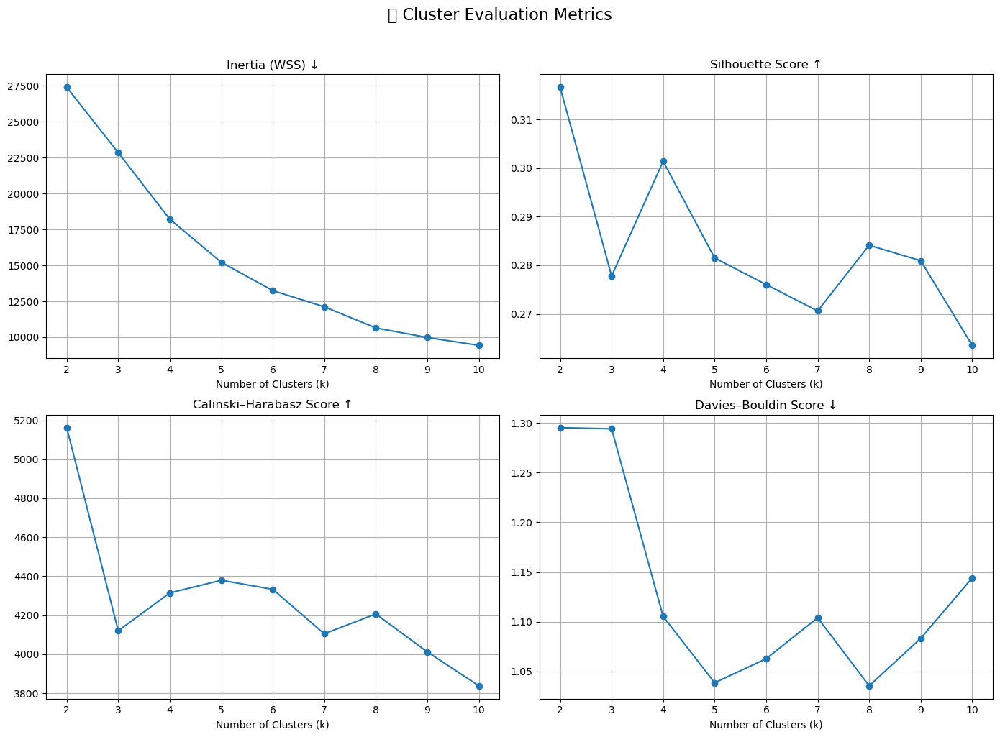

In [81]:
cluster_vars = ['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L']
evaluate_all_cluster_scores(df_cluster_ready, cluster_vars)


In [93]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math

def run_kmeans_analysis(df, cluster_vars, nclust=6, label_prefix='met_regime'):
    df = df.copy()
    label_col = f"{label_prefix}_{nclust}"
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df[cluster_vars])
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=nclust, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X_scaled)
    df[label_col] = (labels + 1).astype(str)  # string labels for consistent mapping

    cluster_ids = sorted(df[label_col].unique(), key=lambda x: int(x))
    base_colors = sns.color_palette("Set2", max(8, nclust))
    cluster_palette = {str(i): base_colors[i - 1] for i in range(1, nclust + 1)}

    # 1️⃣ Violin plots of clustering variables
    units = {
        'air_temperature': '[K]',
        'h2o_mixing_ratio': '[mmol mol⁻¹]',
        'u*': '[m s⁻¹]',
        'z_over_L': '[-]'
    }
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
    for ax, var in zip(axes.flatten(), cluster_vars):
        sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
                       hue_order=cluster_ids, ax=ax, inner='box', cut=0)
        ax.set_title(f'{var} by Regime')
        ax.set_ylabel(f"{var} {units.get(var, '')}")
        ax.grid(True)
    fig.suptitle(f"Violin Plots of Variables by Regime (k={nclust})", fontsize=15)
    plt.show()

    # 2️⃣ Total cluster count
    plt.figure(figsize=(8, 5))
    sns.countplot(data=df, x=label_col, palette=cluster_palette, order=cluster_ids)
    plt.title("Total Regime Count")
    plt.xlabel("Regime")
    plt.ylabel("Count")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 3️⃣ Diurnal frequency
    diurnal = df.groupby(['hour', label_col]).size().unstack(fill_value=0)
    diurnal = diurnal.divide(diurnal.sum(axis=1), axis=0)
    plt.figure(figsize=(10, 5))
    for cid in cluster_ids:
        plt.plot(diurnal.index, diurnal[cid], label=f'Regime {cid}', lw=2,
                 marker='o', color=cluster_palette[cid])
    plt.title("Hourly Regime Frequency")
    plt.xlabel("Hour")
    plt.ylabel("Proportion")
    plt.grid(True)
    plt.legend(title='Regime')
    plt.tight_layout()
    plt.show()

    # 4️⃣ Monthly frequency
    monthly = df.groupby(['month', label_col]).size().unstack(fill_value=0)
    monthly = monthly.divide(monthly.sum(axis=1), axis=0)
    plt.figure(figsize=(10, 5))
    for cid in cluster_ids:
        plt.plot(monthly.index, monthly[cid], label=f'Regime {cid}', lw=2,
                 marker='s', color=cluster_palette[cid])
    plt.title("Monthly Regime Frequency")
    plt.xlabel("Month")
    plt.ylabel("Proportion")
    plt.grid(True)
    plt.legend(title='Regime')
    plt.tight_layout()
    plt.show()

    # 5️⃣ u* vs z/L colored by cluster
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x='z_over_L', y='u*', hue=label_col,
                    palette=cluster_palette, hue_order=cluster_ids,
                    s=40, alpha=0.7, edgecolor='k', linewidth=0.2)
    plt.axvline(0, color='gray', linestyle='--')
    plt.title("Turbulence Structure: u* vs z/L")
    plt.xlabel("z / L")
    plt.ylabel("u* [m s⁻¹]")
    plt.grid(True)
    plt.legend(title='Regime')
    plt.tight_layout()
    plt.show()

    # 6️⃣ Flux distributions
    flux_vars = ['Tau', 'H', 'LE', 'co2_flux', 'h2o_flux']
    flux_labels = {
        'Tau': 'Momentum Flux τ [kg m⁻¹ s⁻²]',
        'H': 'Sensible Heat H [W m⁻²]',
        'LE': 'Latent Heat LE [W m⁻²]',
        'co2_flux': 'CO₂ Flux [μmol m⁻² s⁻¹]',
        'h2o_flux': 'H₂O Flux [mmol m⁻² s⁻¹]'
    }
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    axes = axes.flatten()
    for i, var in enumerate(flux_vars):
        sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
                    order=cluster_ids, ax=axes[i], showfliers=False)
        sns.stripplot(data=df, x=label_col, y=var, order=cluster_ids,
                      color='black', size=1.5, alpha=0.2, ax=axes[i])
        axes[i].set_title(flux_labels[var])
        axes[i].grid(True)
    if len(flux_vars) < len(axes):
        for j in range(len(flux_vars), len(axes)):
            axes[j].axis('off')
    fig.suptitle(f"Flux Distributions by Regime (k={nclust})", fontsize=15)
    plt.show()

    return df


/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_p

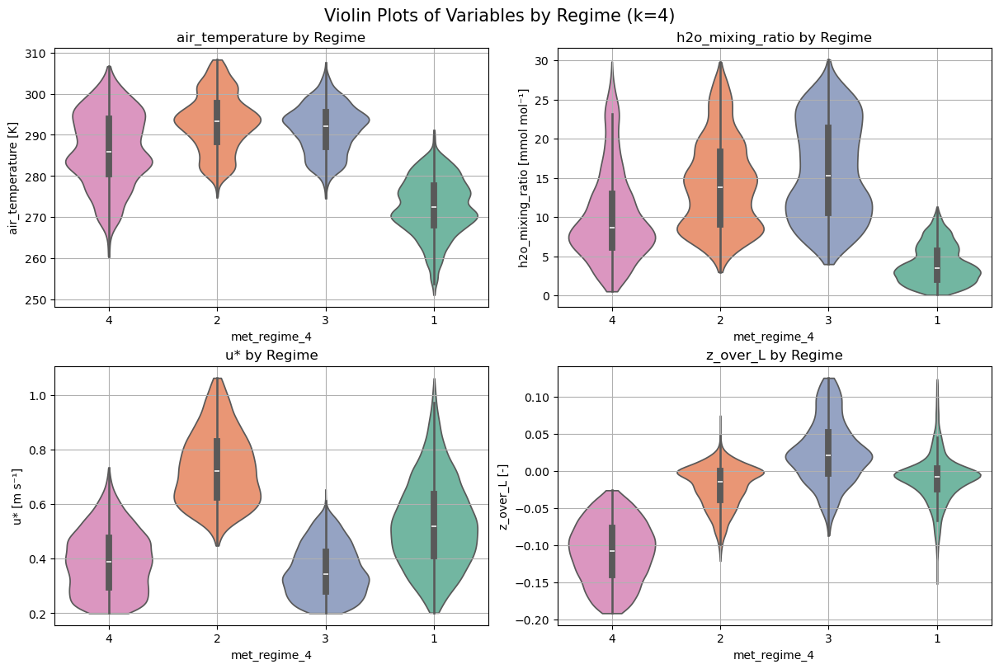

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=label_col, palette=cluster_palette, order=cluster_ids)


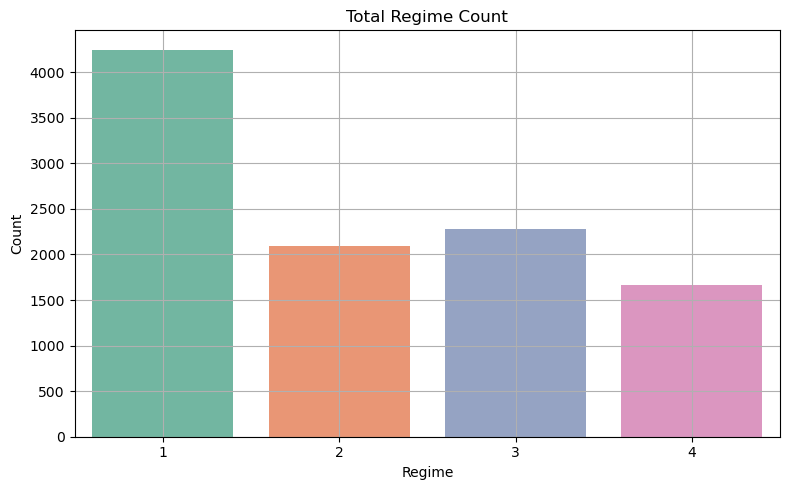

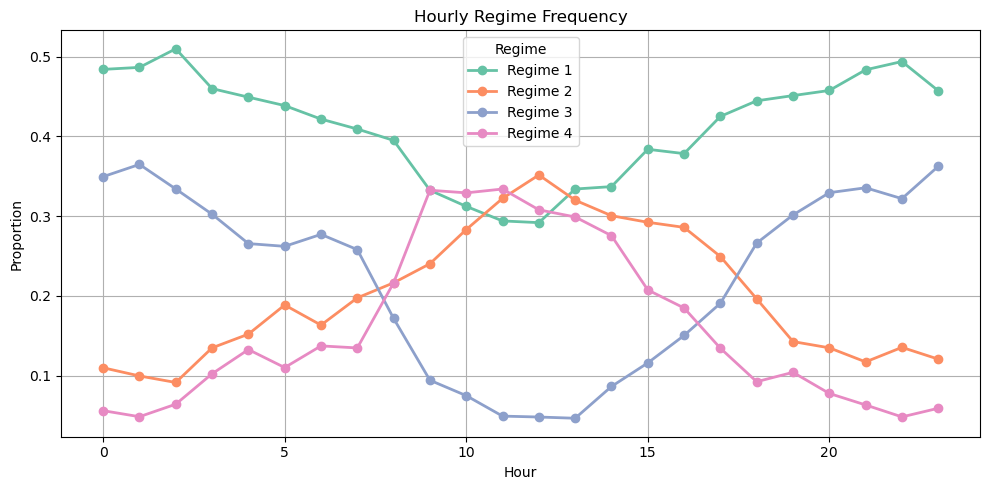

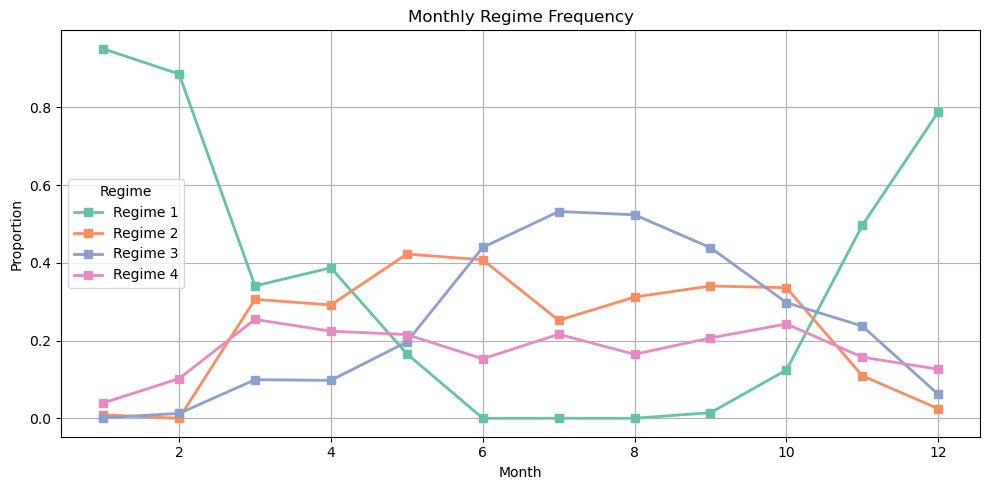

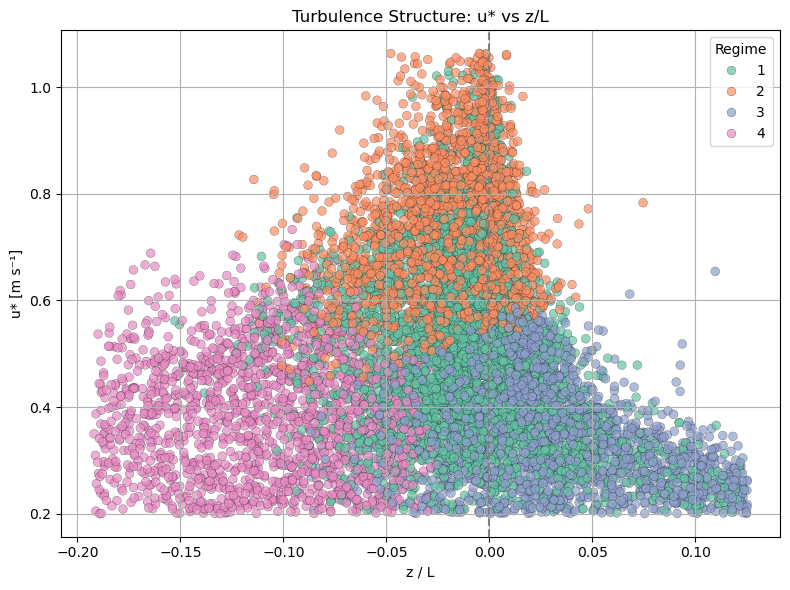

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette

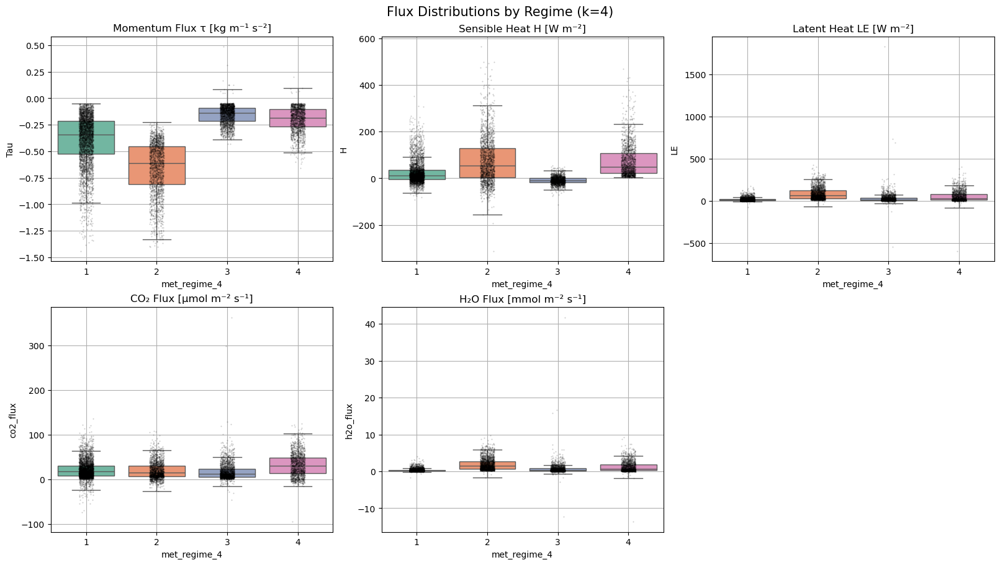

,time,filename,DOY,daytime,file_records,used_records,Tau,qc_Tau,H,qc_H,...,date,hour,month,doy,weekday,is_weekend,season,inv_L,z_over_L,met_regime_4
0,2024-06-30 19:30:00-05:00,2024-07-01T000000_smart3-00694.ghg,183.0208,0,18000,18000,-0.280429,0,61.07920,0,...,2024-06-30,19,6,182,6,True,Summer,-0.006162,-0.061616,4
1,2024-06-30 20:00:00-05:00,2024-07-01T003000_smart3-00694.ghg,183.0416,0,18000,18000,-0.314328,0,16.81880,1,...,2024-06-30,20,6,182,6,True,Summer,-0.001432,-0.014316,2
2,2024-06-30 20:30:00-05:00,2024-07-01T010000_smart3-00694.ghg,183.0624,0,18000,18000,-0.294692,0,-9.44987,1,...,2024-06-30,20,6,182,6,True,Summer,0.000888,0.008883,3
3,2024-06-30 21:00:00-05:00,2024-07-01T013000_smart3-00694.ghg,183.0833,0,18000,18000,-0.256751,0,-9.39110,0,...,2024-06-30,21,6,182,6,True,Summer,0.001086,0.010859,3
4,2024-06-30 21:30:00-05:00,2024-07-01T020000_smart3-00694.ghg,183.1041,0,18000,18000,-0.099182,0,3.28159,1,...,2024-06-30,21,6,182,6,True,Summer,-0.001582,-0.015816,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14999,2025-06-27 17:00:00-05:00,2025-06-27T213000_smart3-00694.ghg,178.9165,0,36000,36000,-0.157314,0,-21.73820,1,...,2025-06-27,17,6,178,4,False,Summer,0.004929,0.049285,3
15000,2025-06-27 17:30:00-05:00,2025-06-27T220000_smart3-00694.ghg,178.9373,0,36000,36000,-0.232258,0,-13.03480,0,...,2025-06-27,17,6,178,4,False,Summer,0.001652,0.016525,3
15001,2025-06-27 18:00:00-05:00,2025-06-27T223000_smart3-00694.ghg,178.9581,0,36000,36000,-0.224793,0,-11.77230,0,...,2025-06-27,18,6,178,4,False,Summer,0.001571,0.015706,3
15002,2025-06-27 18:30:00-05:00,2025-06-27T230000_smart3-00694.ghg,178.9790,0,36000,36000,-0.215534,0,-35.30500,1,...,2025-06-27,18,6,178,4,False,Summer,0.005026,0.050261,3


In [94]:
run_kmeans_analysis(df_cluster_ready, cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L'], nclust=4)

# wekend Vs Weekday

In [97]:
from scipy.stats import mannwhitneyu

def test_flux_weekday_vs_weekend(df, cluster_col, flux_vars=None):
    """
    Compare weekday vs. weekend fluxes per cluster using Mann–Whitney U test.

    Parameters:
    - df: DataFrame containing flux and cluster info
    - cluster_col: column name containing cluster labels (e.g. 'met_regime_6')
    - flux_vars: list of flux variable names (optional)

    Returns:
    - DataFrame with comparison stats
    """
    df = df.copy()
    df[cluster_col] = df[cluster_col].astype(str)

    # Auto-select default flux variables if not provided
    if flux_vars is None:
        flux_vars = ['Tau', 'H', 'LE', 'co2_flux', 'h2o_flux']

    # Tag day type
    if 'is_weekend' not in df.columns:
        df['weekday'] = df['time'].dt.weekday
        df['is_weekend'] = df['weekday'] >= 5
    df['day_type'] = np.where(df['is_weekend'], 'Weekend', 'Weekday')

    # Run test per regime and flux variable
    results = []
    for regime in sorted(df[cluster_col].unique(), key=lambda x: int(x)):
        sub_df = df[df[cluster_col] == regime]
        for var in flux_vars:
            weekday_vals = sub_df[sub_df['day_type'] == 'Weekday'][var].dropna()
            weekend_vals = sub_df[sub_df['day_type'] == 'Weekend'][var].dropna()

            if len(weekday_vals) > 5 and len(weekend_vals) > 5:
                stat, p = mannwhitneyu(weekday_vals, weekend_vals, alternative='two-sided')
                results.append({
                    'Regime': regime,
                    'Flux': var,
                    'Weekday Mean': weekday_vals.mean(),
                    'Weekend Mean': weekend_vals.mean(),
                    'U-statistic': stat,
                    'p-value': p
                })

    return pd.DataFrame(results)


In [102]:
results_df = test_flux_weekday_vs_weekend(df_clustered_5, cluster_col='met_regime_5')
print(results_df)


   Regime      Flux  Weekday Mean  Weekend Mean  U-statistic       p-value
0       1       Tau     -0.423396     -0.374317     700033.0  9.028767e-09
1       1         H     34.945299     24.068934     832542.0  5.162340e-12
2       1        LE     12.638866     12.088409     807938.0  5.965286e-04
3       1  co2_flux     23.054999     19.407396     833209.5  4.487805e-10
4       1  h2o_flux      0.279997      0.268114     807713.0  6.239839e-04
5       2       Tau     -0.723370     -0.693995     377757.5  1.943529e-02
6       2         H     63.599142     79.654162     332668.0  2.255406e-03
7       2        LE     69.403661     63.880969     396895.0  1.701194e-01
8       2  co2_flux     24.382034     21.551187     390124.0  2.236529e-02
9       2  h2o_flux      1.567727      1.440489     397170.0  1.625223e-01
10      3       Tau     -0.166746     -0.171453     515934.0  3.018087e-01
11      3         H     -7.947478     -6.696935     377426.5  5.357221e-02
12      3        LE     1

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_weekday_weekend_flux_differences(results_df, cluster_order=None, mark_significance=True):
    """
    Plots grouped bar charts of weekday vs weekend flux means per cluster.
    
    Parameters:
    - results_df: DataFrame from test_flux_weekday_vs_weekend()
    - cluster_order: Optional order of cluster labels (as strings)
    - mark_significance: If True, marks p<0.05 with asterisk (*)
    """
    if cluster_order is None:
        cluster_order = sorted(results_df['Regime'].unique(), key=lambda x: int(x))

    fluxes = results_df['Flux'].unique()
    palette = {'Weekday': '#4daf4a', 'Weekend': '#984ea3'}

    for flux in fluxes:
        data = results_df[results_df['Flux'] == flux].copy()
        data_melted = pd.melt(
            data,
            id_vars=['Regime', 'p-value'],
            value_vars=['Weekday Mean', 'Weekend Mean'],
            var_name='Day Type',
            value_name='Flux Mean'
        )

        # Clean up labels
        data_melted['Day Type'] = data_melted['Day Type'].str.replace(' Mean', '')

        # Plot
        plt.figure(figsize=(10, 5))
        sns.barplot(
            data=data_melted,
            x='Regime',
            y='Flux Mean',
            hue='Day Type',
            order=cluster_order,
            hue_order=['Weekday', 'Weekend'],
            palette=palette
        )

        # Add significance markers
        if mark_significance:
            for i, row in data.iterrows():
                if row['p-value'] < 0.05:
                    xloc = cluster_order.index(row['Regime'])
                    ymax = max(row['Weekday Mean'], row['Weekend Mean'])
                    plt.text(xloc, ymax * 1.05, "*", ha='center', fontsize=14, color='red')

        plt.title(f"{flux} Mean by Regime: Weekday vs Weekend")
        plt.xlabel("Regime")
        plt.ylabel(f"{flux} Mean")
        plt.legend(title='Day Type')
        plt.grid(True, axis='y')
        plt.tight_layout()
        plt.show()


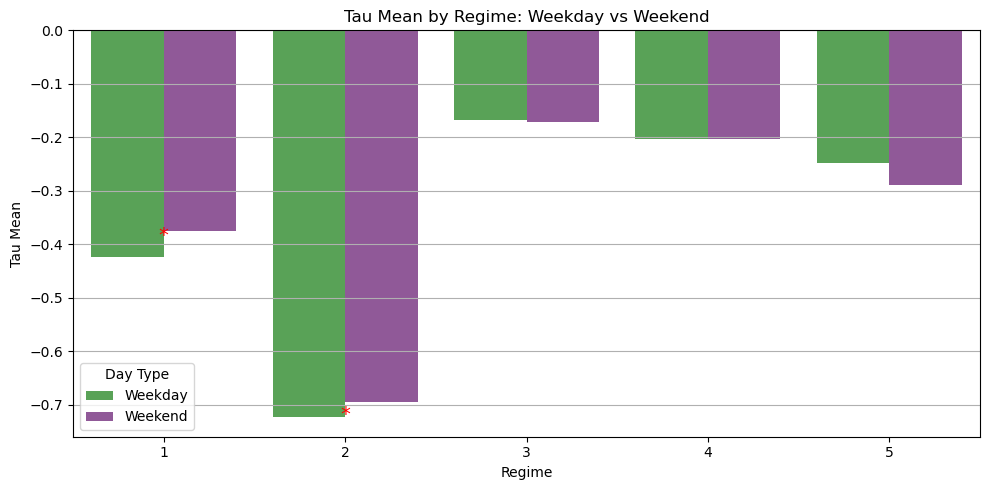

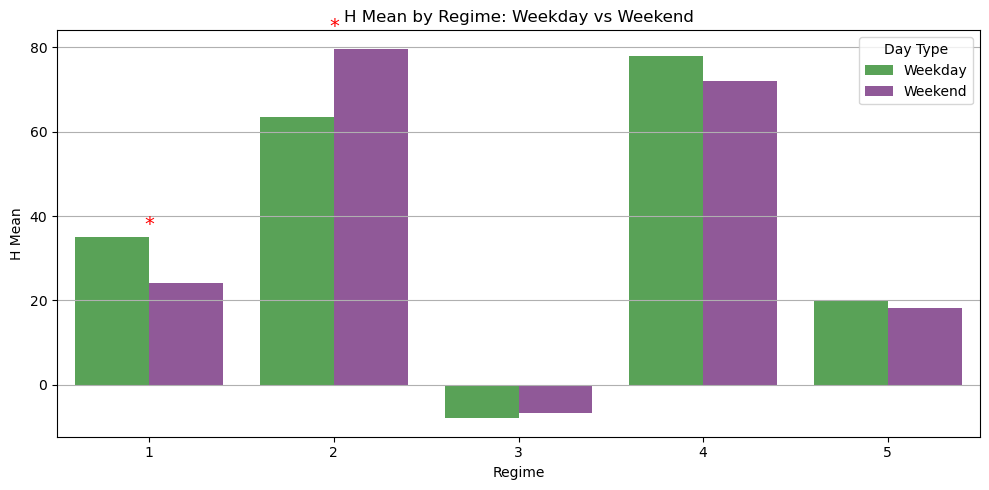

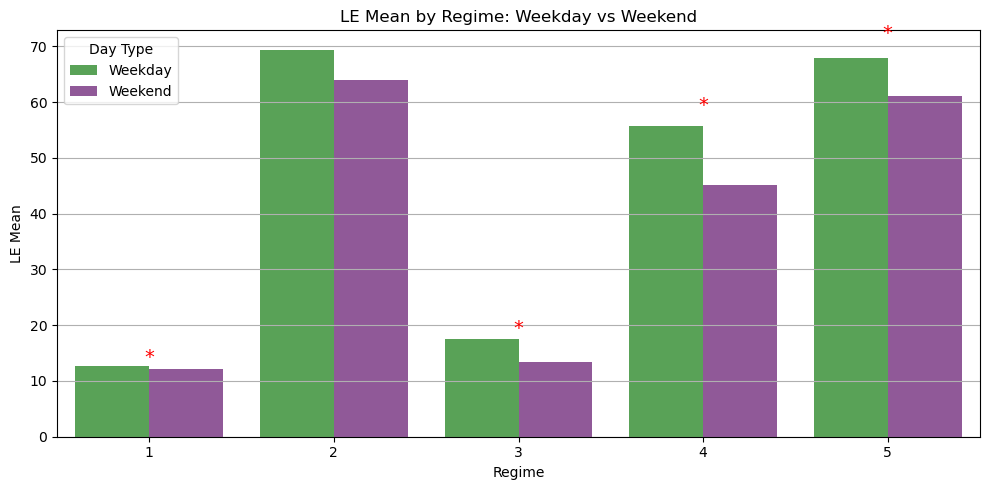

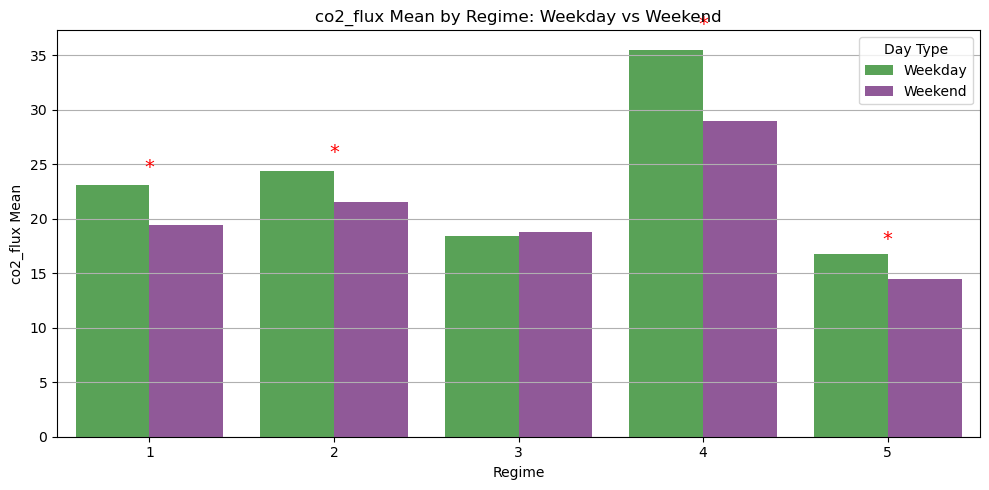

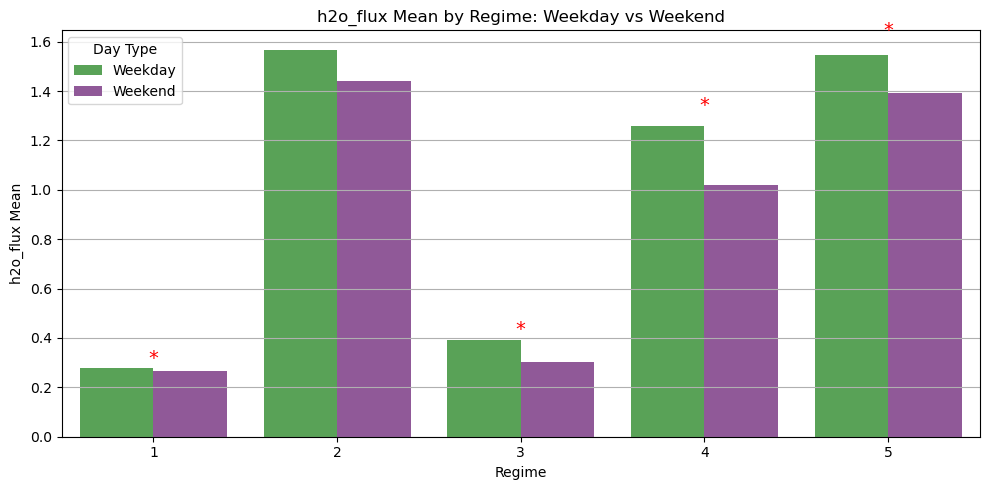

In [104]:
plot_weekday_weekend_flux_differences(results_df)


# 5 Clusters

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_p

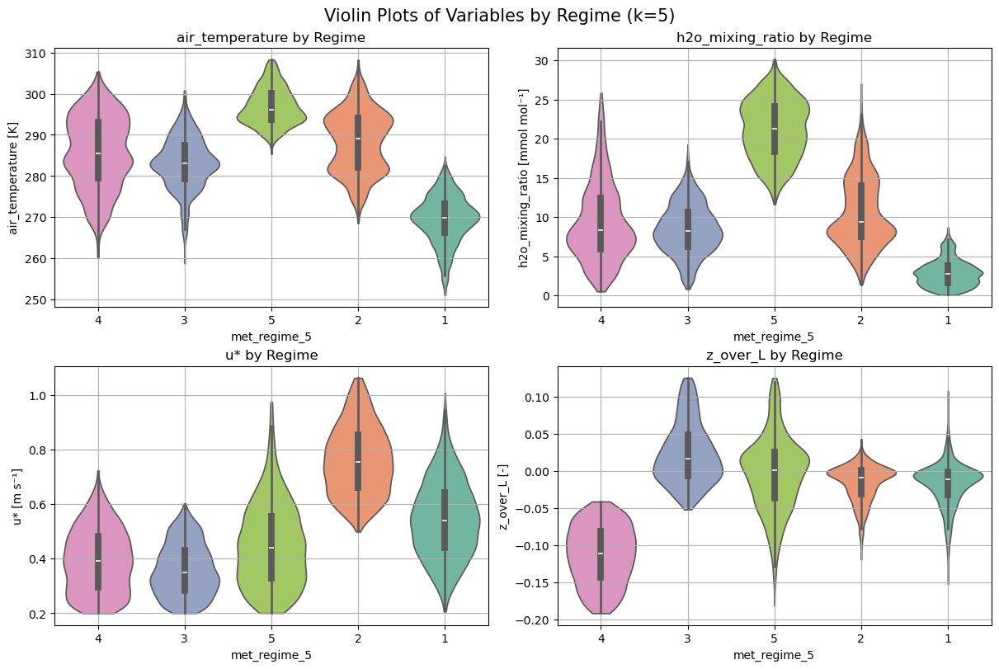

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=label_col, palette=cluster_palette, order=cluster_ids)


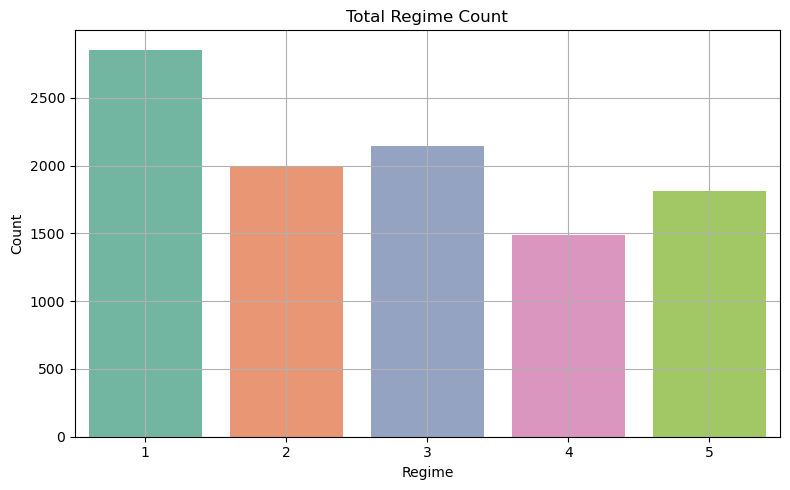

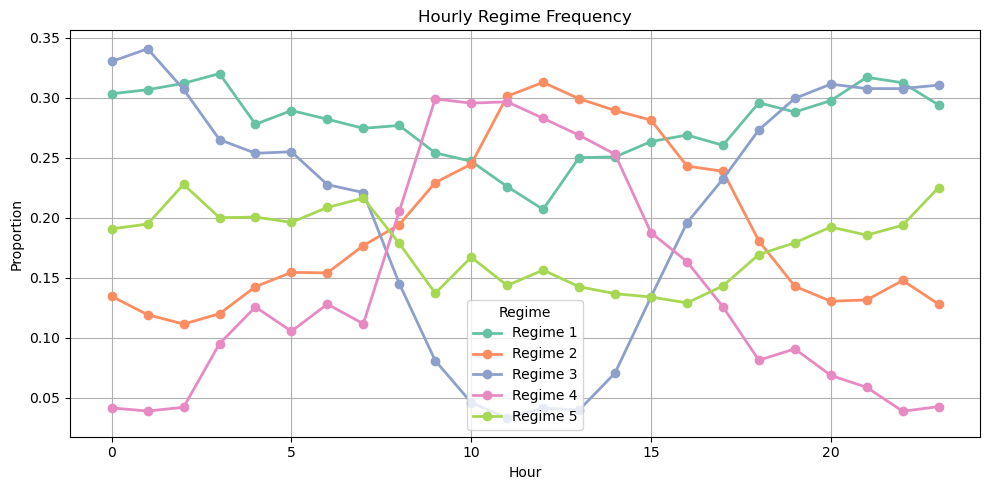

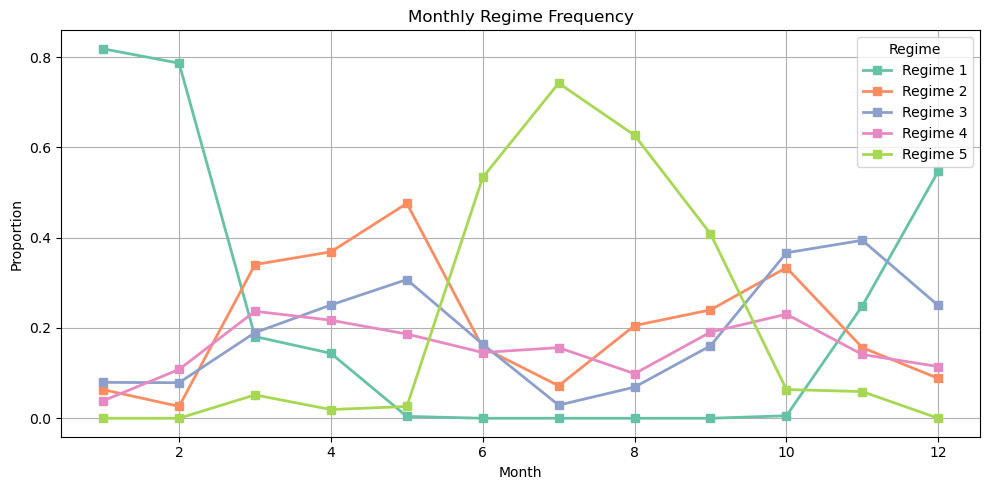

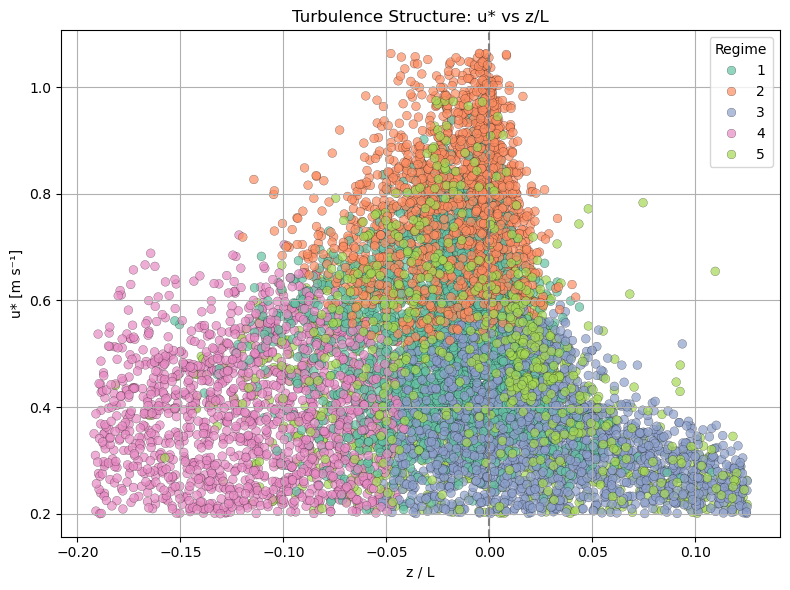

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette

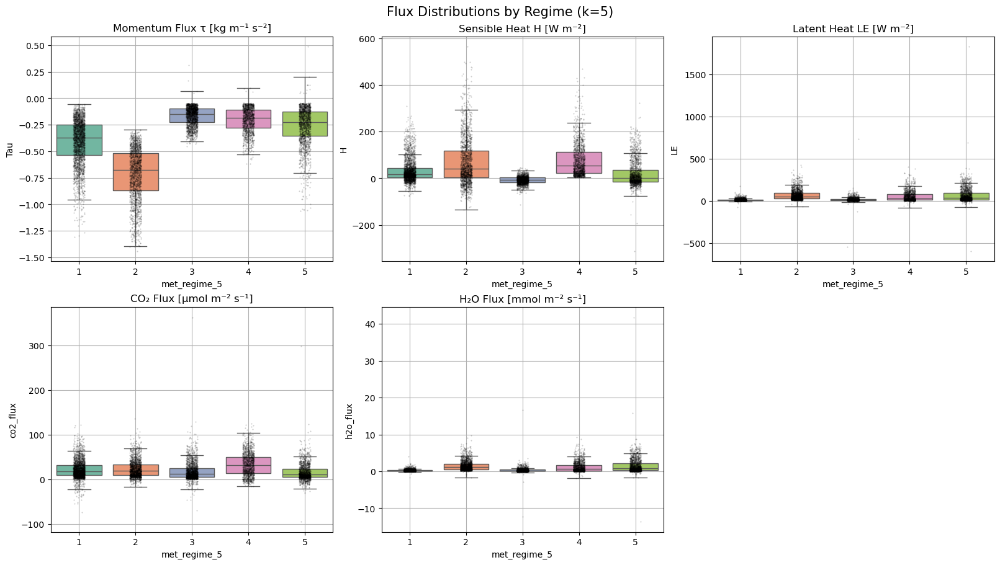

,time,filename,DOY,daytime,file_records,used_records,Tau,qc_Tau,H,qc_H,...,date,hour,month,doy,weekday,is_weekend,season,inv_L,z_over_L,met_regime_5
0,2024-06-30 19:30:00-05:00,2024-07-01T000000_smart3-00694.ghg,183.0208,0,18000,18000,-0.280429,0,61.07920,0,...,2024-06-30,19,6,182,6,True,Summer,-0.006162,-0.061616,4
1,2024-06-30 20:00:00-05:00,2024-07-01T003000_smart3-00694.ghg,183.0416,0,18000,18000,-0.314328,0,16.81880,1,...,2024-06-30,20,6,182,6,True,Summer,-0.001432,-0.014316,3
2,2024-06-30 20:30:00-05:00,2024-07-01T010000_smart3-00694.ghg,183.0624,0,18000,18000,-0.294692,0,-9.44987,1,...,2024-06-30,20,6,182,6,True,Summer,0.000888,0.008883,3
3,2024-06-30 21:00:00-05:00,2024-07-01T013000_smart3-00694.ghg,183.0833,0,18000,18000,-0.256751,0,-9.39110,0,...,2024-06-30,21,6,182,6,True,Summer,0.001086,0.010859,3
4,2024-06-30 21:30:00-05:00,2024-07-01T020000_smart3-00694.ghg,183.1041,0,18000,18000,-0.099182,0,3.28159,1,...,2024-06-30,21,6,182,6,True,Summer,-0.001582,-0.015816,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14999,2025-06-27 17:00:00-05:00,2025-06-27T213000_smart3-00694.ghg,178.9165,0,36000,36000,-0.157314,0,-21.73820,1,...,2025-06-27,17,6,178,4,False,Summer,0.004929,0.049285,5
15000,2025-06-27 17:30:00-05:00,2025-06-27T220000_smart3-00694.ghg,178.9373,0,36000,36000,-0.232258,0,-13.03480,0,...,2025-06-27,17,6,178,4,False,Summer,0.001652,0.016525,5
15001,2025-06-27 18:00:00-05:00,2025-06-27T223000_smart3-00694.ghg,178.9581,0,36000,36000,-0.224793,0,-11.77230,0,...,2025-06-27,18,6,178,4,False,Summer,0.001571,0.015706,5
15002,2025-06-27 18:30:00-05:00,2025-06-27T230000_smart3-00694.ghg,178.9790,0,36000,36000,-0.215534,0,-35.30500,1,...,2025-06-27,18,6,178,4,False,Summer,0.005026,0.050261,5


In [96]:
run_kmeans_analysis(df_cluster_ready, cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L'], nclust=5)

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_p

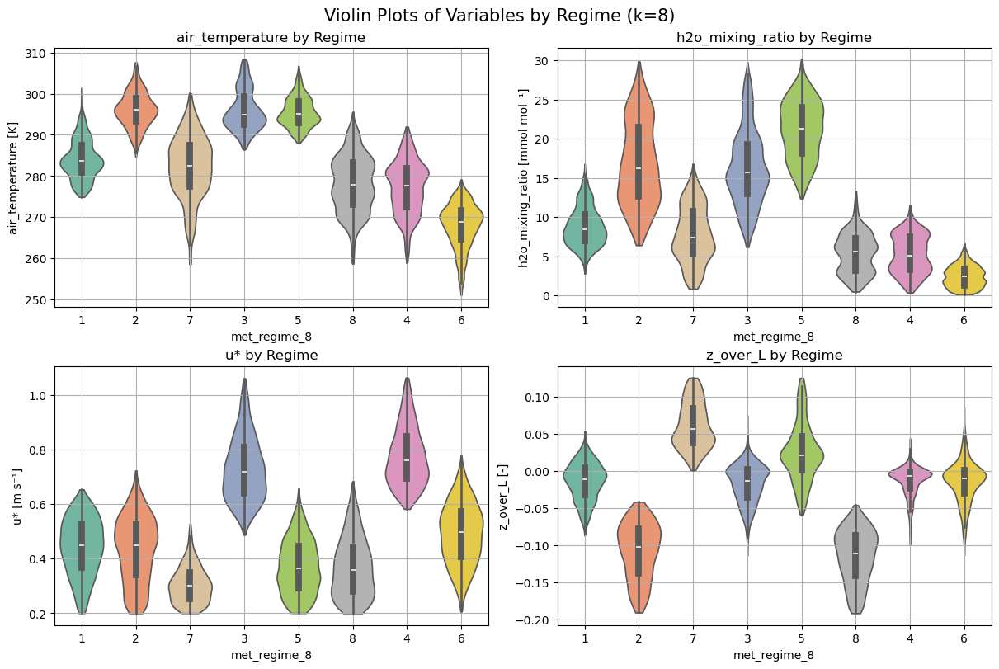

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=label_col, palette=cluster_palette, order=cluster_ids)


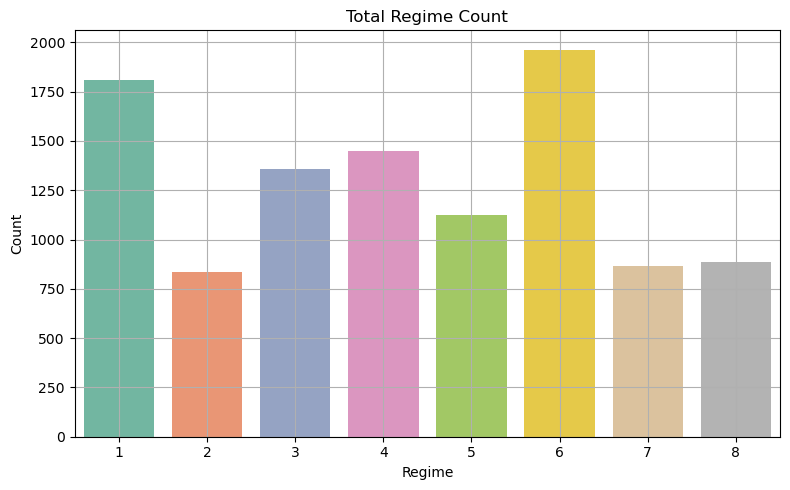

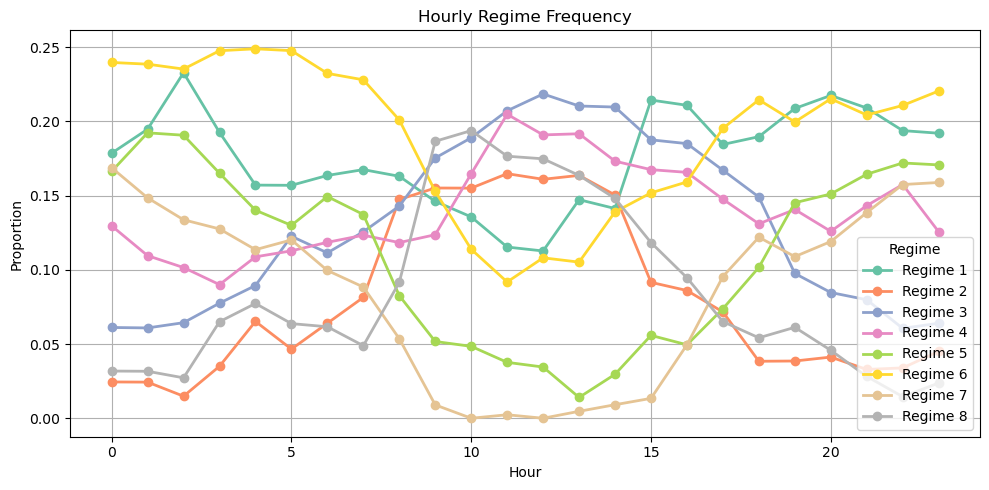

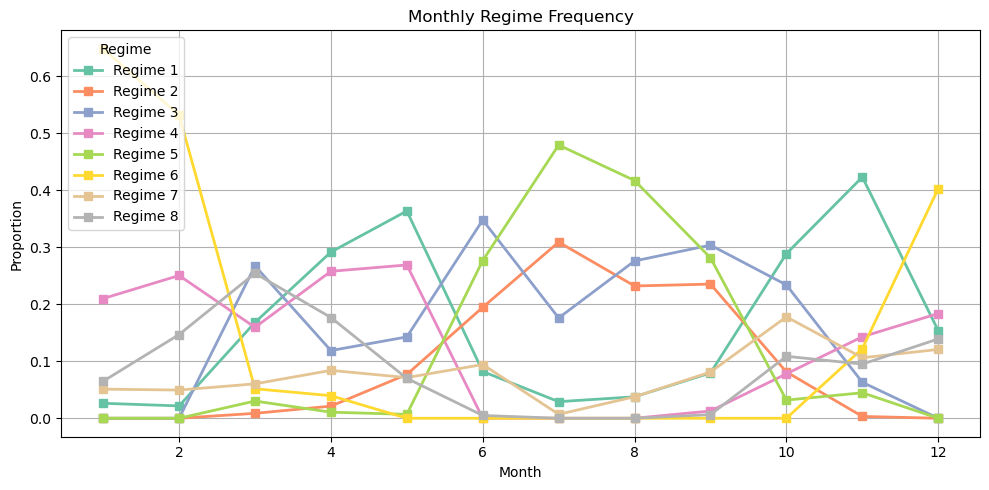

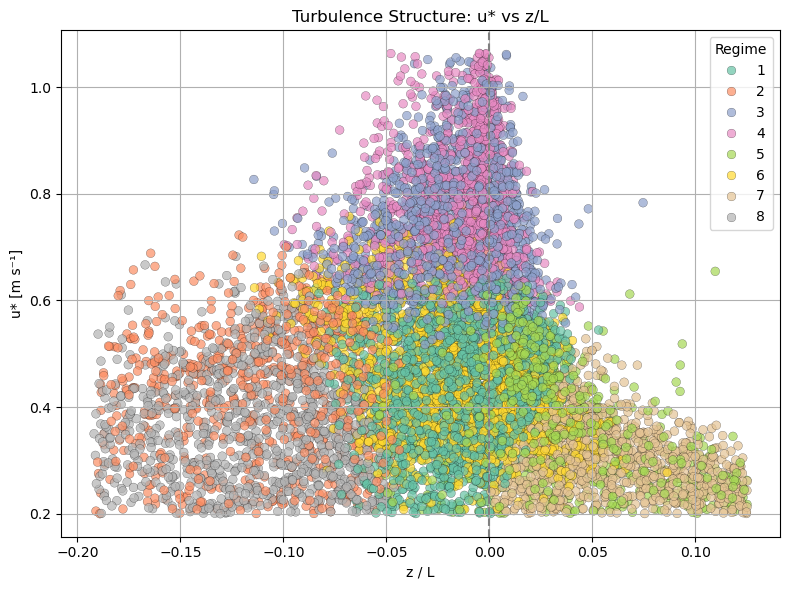

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/621071192.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette

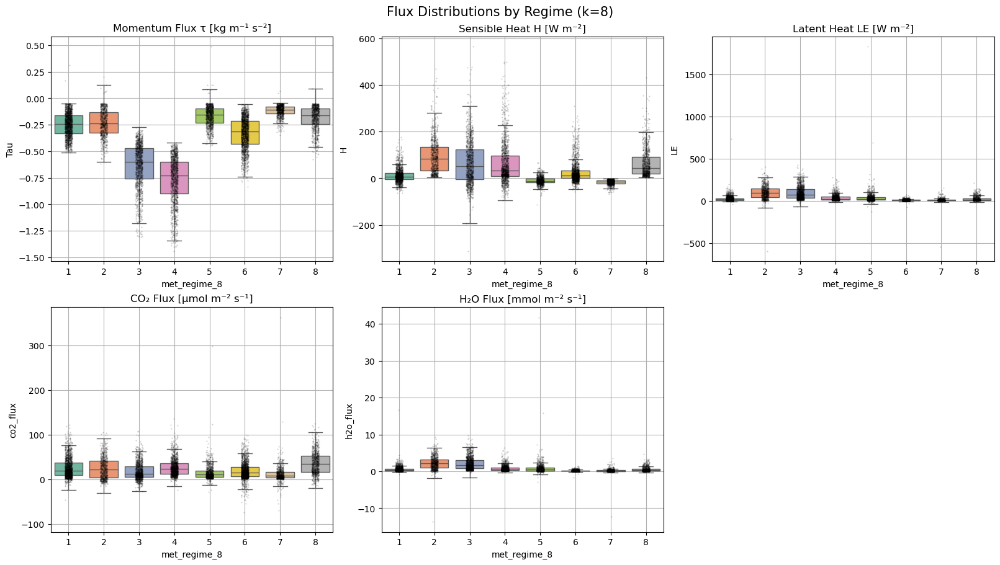

,time,filename,DOY,daytime,file_records,used_records,Tau,qc_Tau,H,qc_H,...,date,hour,month,doy,weekday,is_weekend,season,inv_L,z_over_L,met_regime_8
0,2024-06-30 19:30:00-05:00,2024-07-01T000000_smart3-00694.ghg,183.0208,0,18000,18000,-0.280429,0,61.07920,0,...,2024-06-30,19,6,182,6,True,Summer,-0.006162,-0.061616,1
1,2024-06-30 20:00:00-05:00,2024-07-01T003000_smart3-00694.ghg,183.0416,0,18000,18000,-0.314328,0,16.81880,1,...,2024-06-30,20,6,182,6,True,Summer,-0.001432,-0.014316,1
2,2024-06-30 20:30:00-05:00,2024-07-01T010000_smart3-00694.ghg,183.0624,0,18000,18000,-0.294692,0,-9.44987,1,...,2024-06-30,20,6,182,6,True,Summer,0.000888,0.008883,1
3,2024-06-30 21:00:00-05:00,2024-07-01T013000_smart3-00694.ghg,183.0833,0,18000,18000,-0.256751,0,-9.39110,0,...,2024-06-30,21,6,182,6,True,Summer,0.001086,0.010859,1
4,2024-06-30 21:30:00-05:00,2024-07-01T020000_smart3-00694.ghg,183.1041,0,18000,18000,-0.099182,0,3.28159,1,...,2024-06-30,21,6,182,6,True,Summer,-0.001582,-0.015816,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14999,2025-06-27 17:00:00-05:00,2025-06-27T213000_smart3-00694.ghg,178.9165,0,36000,36000,-0.157314,0,-21.73820,1,...,2025-06-27,17,6,178,4,False,Summer,0.004929,0.049285,5
15000,2025-06-27 17:30:00-05:00,2025-06-27T220000_smart3-00694.ghg,178.9373,0,36000,36000,-0.232258,0,-13.03480,0,...,2025-06-27,17,6,178,4,False,Summer,0.001652,0.016525,5
15001,2025-06-27 18:00:00-05:00,2025-06-27T223000_smart3-00694.ghg,178.9581,0,36000,36000,-0.224793,0,-11.77230,0,...,2025-06-27,18,6,178,4,False,Summer,0.001571,0.015706,5
15002,2025-06-27 18:30:00-05:00,2025-06-27T230000_smart3-00694.ghg,178.9790,0,36000,36000,-0.215534,0,-35.30500,1,...,2025-06-27,18,6,178,4,False,Summer,0.005026,0.050261,5


In [106]:
run_kmeans_analysis(df_cluster_ready, cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L'], nclust=8)

# test

In [111]:
def run_kmeans_analysis(
    df,
    cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L'],
    nclust=6,
    label_prefix='met_regime',
    ylims=None  # optional: e.g. {'H': (-50, 200), 'co2_flux': (-10, 40)}
):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    from scipy.stats import mannwhitneyu
    import seaborn as sns
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    df = df.copy()
    label_col = f"{label_prefix}_{nclust}"

    # Clustering
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df[cluster_vars])
    kmeans = KMeans(n_clusters=nclust, random_state=42, n_init='auto')
    df[label_col] = (kmeans.fit_predict(X_scaled) + 1).astype(str)
    cluster_ids = sorted(df[label_col].unique(), key=lambda x: int(x))

    palette = sns.color_palette("Set2", max(8, nclust))
    cluster_palette = {cid: palette[int(cid)-1] for cid in cluster_ids}

    df['weekday'] = df['time'].dt.weekday
    df['is_weekend'] = df['weekday'] >= 5
    df['day_type'] = np.where(df['is_weekend'], 'Weekend', 'Weekday')

    # Violin plots of input variables
    units = {
        'air_temperature': '[K]',
        'h2o_mixing_ratio': '[mmol mol⁻¹]',
        'u*': '[m s⁻¹]',
        'z_over_L': '[-]'
    }
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
    for i, (ax, var) in enumerate(zip(axes.flatten(), cluster_vars)):
        sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
                       order=cluster_ids, inner='box', cut=0, ax=ax)
        ax.set_ylabel(f"{var} {units.get(var, '')}")
        if ylims and var in ylims:
            ax.set_ylim(ylims[var])
        ax.grid(True)
        ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', weight='bold')
    plt.show()

    # Regime frequency: total, hourly, monthly
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

    # a. Total count
    sns.countplot(data=df, x=label_col, palette=cluster_palette,
                  order=cluster_ids, ax=axes[0])
    axes[0].set_xlabel("Regime")
    axes[0].set_ylabel("Count")
    axes[0].grid(True)
    axes[0].text(0.01, 0.95, "a.", transform=axes[0].transAxes, fontsize=12,
                 verticalalignment='top', weight='bold')

    # b. Hourly frequency
    diurnal = df.groupby(['hour', label_col]).size().unstack(fill_value=0)
    diurnal = diurnal.divide(diurnal.sum(axis=1), axis=0)
    for cid in cluster_ids:
        axes[1].plot(diurnal.index, diurnal[cid], color=cluster_palette[cid])
        axes[1].text(diurnal.index[-1]+0.2, diurnal[cid].iloc[-1], f"{cid}",
                     color=cluster_palette[cid], fontsize=9)
    axes[1].set_xlabel("Hour")
    axes[1].set_ylabel("Proportion")
    axes[1].grid(True)
    axes[1].text(0.01, 0.95, "b.", transform=axes[1].transAxes, fontsize=12,
                 verticalalignment='top', weight='bold')

    # c. Monthly frequency
    monthly = df.groupby(['month', label_col]).size().unstack(fill_value=0)
    monthly = monthly.divide(monthly.sum(axis=1), axis=0)
    for cid in cluster_ids:
        axes[2].plot(monthly.index, monthly[cid], color=cluster_palette[cid])
        axes[2].text(monthly.index[-1]+0.2, monthly[cid].iloc[-1], f"{cid}",
                     color=cluster_palette[cid], fontsize=9)
    axes[2].set_xlabel("Month")
    axes[2].set_ylabel("Proportion")
    axes[2].grid(True)
    axes[2].text(0.01, 0.95, "c.", transform=axes[2].transAxes, fontsize=12,
                 verticalalignment='top', weight='bold')

    plt.show()

    # Turbulence structure and scalars
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
    features = ['u*', 'air_temperature', 'h2o_mixing_ratio']
    for i, var in enumerate(features):
        sns.scatterplot(data=df, x='z_over_L', y=var, hue=label_col,
                        palette=cluster_palette, hue_order=cluster_ids,
                        s=40, alpha=0.7, edgecolor='k', linewidth=0.2, ax=axes[i])
        axes[i].axvline(0, color='gray', linestyle='--')
        axes[i].set_xlabel("z/L")
        axes[i].set_ylabel(f"{var} {units.get(var, '')}")
        axes[i].text(0.01, 0.95, f"{chr(97+i)}.", transform=axes[i].transAxes, fontsize=12,
                     verticalalignment='top', weight='bold')
        axes[i].grid(True)
        if i > 0:
            axes[i].get_legend().remove()
    axes[0].legend(title='Regime')
    plt.show()

    # Flux Box & Violin
    flux_vars = ['Tau', 'H', 'LE', 'co2_flux']
    flux_labels = {
        'Tau': 'Momentum Flux τ [kg m⁻¹ s⁻²]', 'H': 'Sensible Heat [W m⁻²]',
        'LE': 'Latent Heat [W m⁻²]', 'co2_flux': 'CO₂ Flux [μmol m⁻² s⁻¹]'
    }

    for plot_type in ['box', 'violin']:
        fig, axes = plt.subplots(2, 2, figsize=(14, 9), constrained_layout=True)
        for i, var in enumerate(flux_vars):
            ax = axes[i//2][i%2]
            if plot_type == 'box':
                sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
                            order=cluster_ids, showfliers=False, ax=ax)
                sns.stripplot(data=df, x=label_col, y=var, order=cluster_ids,
                              color='black', size=1.5, alpha=0.2, ax=ax)
            else:
                sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
                               order=cluster_ids, inner='box', cut=0, ax=ax)
            ax.set_ylabel(flux_labels[var])
            ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', weight='bold')
            if ylims and var in ylims:
                ax.set_ylim(ylims[var])
            ax.grid(True)
        plt.show()

    # Weekday vs Weekend Differences
    results = []
    for regime in cluster_ids:
        sub = df[df[label_col] == regime]
        for var in flux_vars:
            wk = sub[sub['day_type'] == 'Weekday'][var].dropna()
            we = sub[sub['day_type'] == 'Weekend'][var].dropna()
            if len(wk) > 5 and len(we) > 5:
                stat, p = mannwhitneyu(wk, we)
                results.append({
                    'Regime': regime, 'Flux': var,
                    'Weekday Mean': wk.mean(), 'Weekend Mean': we.mean(),
                    'U-statistic': stat, 'p-value': p
                })
    results_df = pd.DataFrame(results)

    fig, axes = plt.subplots(2, 2, figsize=(14, 8), constrained_layout=True)
    for i, var in enumerate(flux_vars):
        ax = axes[i//2][i%2]
        subset = results_df[results_df['Flux'] == var]
        bars = pd.melt(subset, id_vars=['Regime', 'p-value'],
                       value_vars=['Weekday Mean', 'Weekend Mean'],
                       var_name='Day', value_name='Mean')
        bars['Day'] = bars['Day'].str.replace(' Mean', '')

        sns.barplot(data=bars, x='Regime', y='Mean', hue='Day',
                    hue_order=['Weekday', 'Weekend'],
                    palette={'Weekday': '#4daf4a', 'Weekend': '#984ea3'}, ax=ax)
        for _, row in subset.iterrows():
            if row['p-value'] < 0.05:
                x = cluster_ids.index(row['Regime'])
                y = max(row['Weekday Mean'], row['Weekend Mean']) * 1.05
                ax.text(x, y, '*', ha='center', fontsize=14, color='red')
        ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', weight='bold')
        ax.grid(True)
    plt.show()

    print("\nWeekday vs Weekend Flux Test Results:")
    print(results_df.to_string(index=False))

    return df, results_df


/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluste

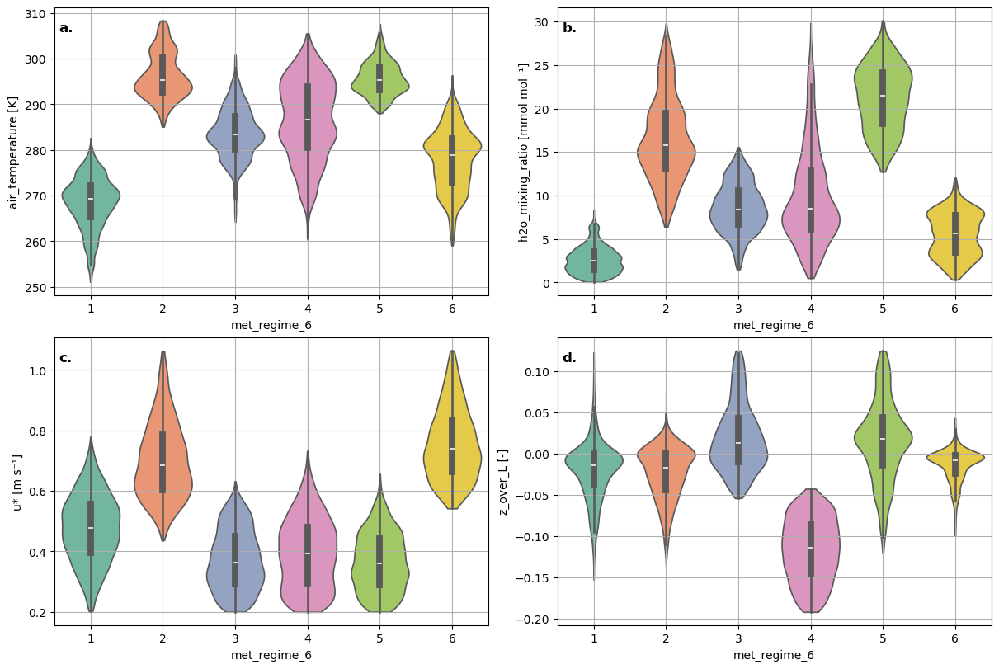

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=label_col, palette=cluster_palette,


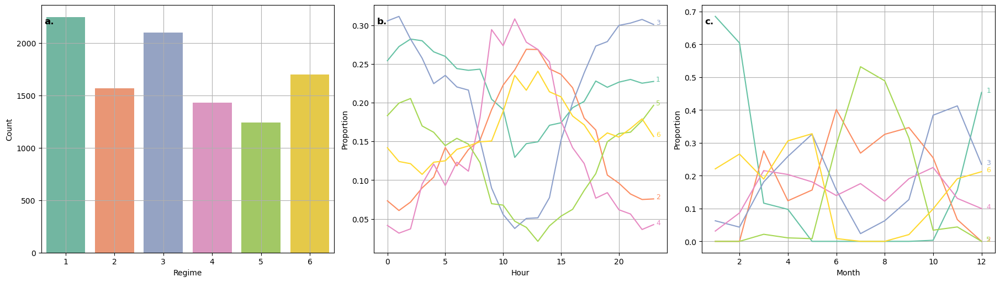

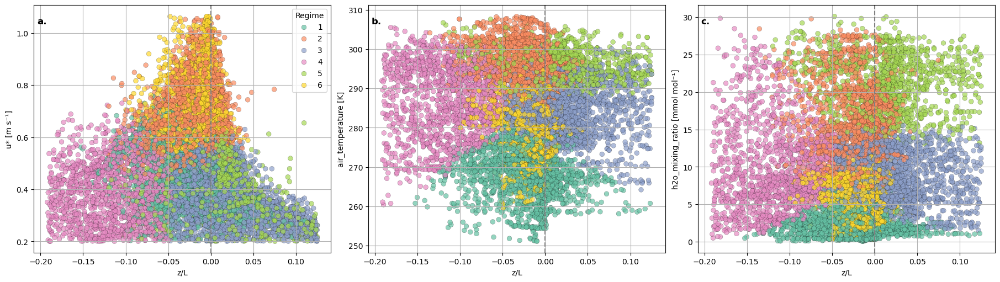

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:122: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:122: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:122: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_pale

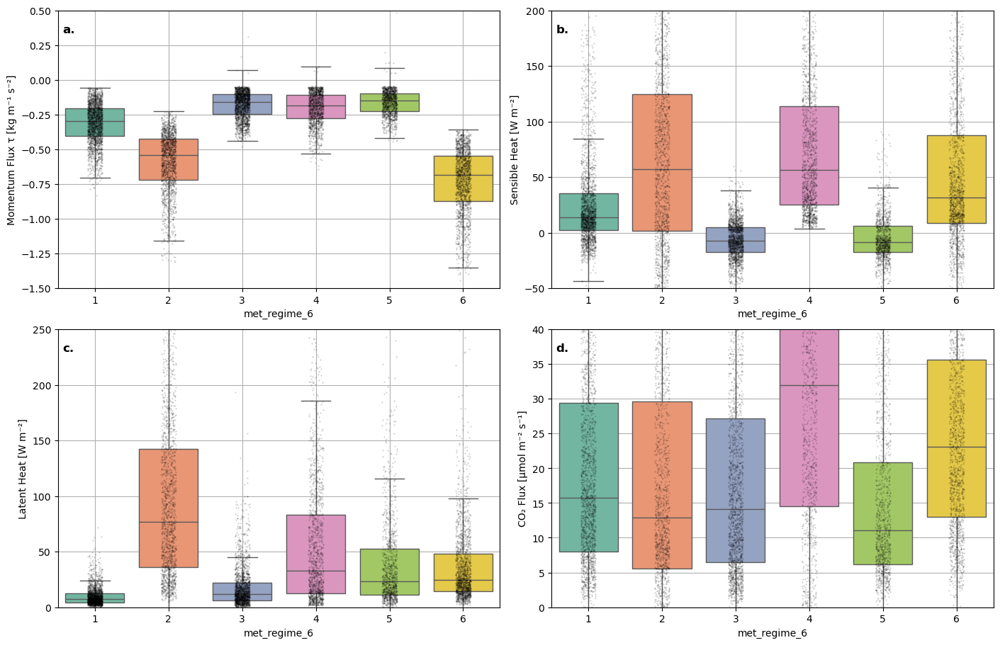

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1557380770.py:127: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=clu

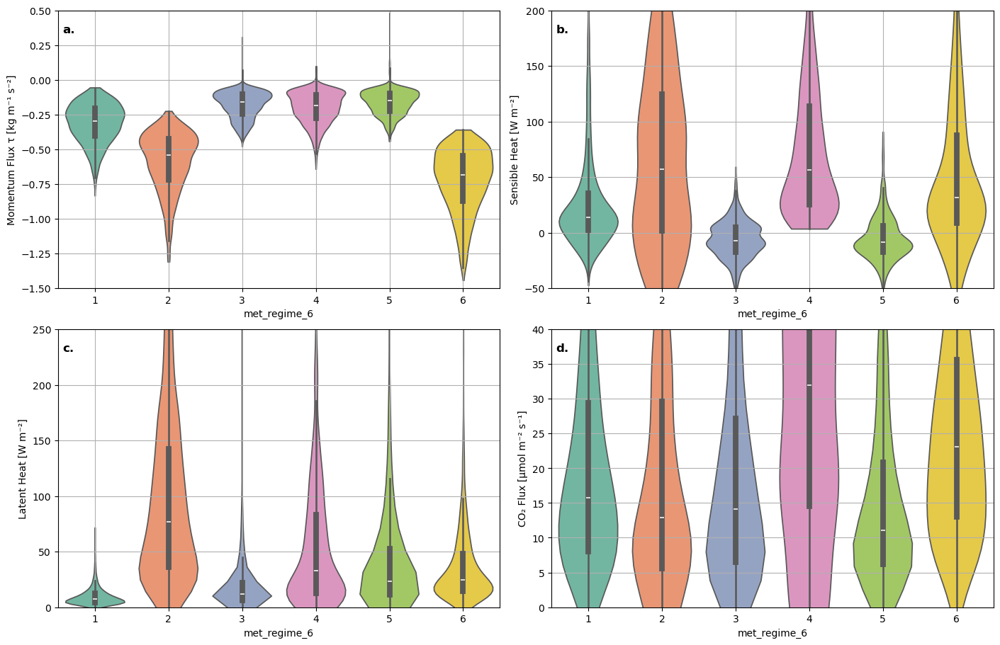

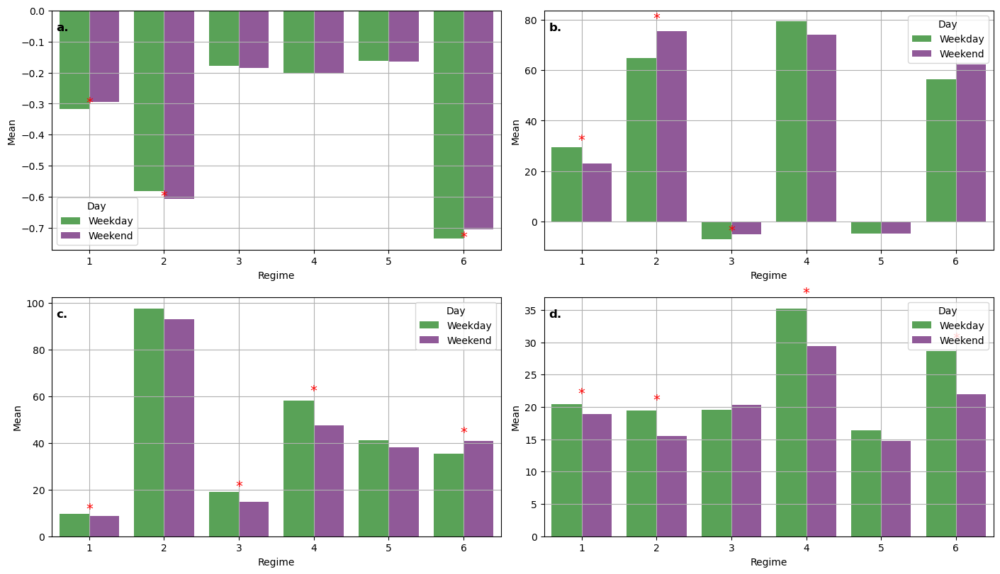


Weekday vs Weekend Flux Test Results:
Regime     Flux  Weekday Mean  Weekend Mean  U-statistic      p-value
     1      Tau     -0.316860     -0.295293     489414.5 6.907884e-03
     1        H     29.407631     22.991508     505717.0 6.395158e-05
     1       LE      9.698249      8.816062     516321.0 3.571952e-03
     1 co2_flux     20.481406     18.875969     508448.5 1.781398e-04
     2      Tau     -0.581711     -0.608039     250366.0 7.119599e-03
     2        H     64.841759     75.277688     189825.0 1.376495e-02
     2       LE     97.640335     93.146823     226226.0 3.388625e-01
     2 co2_flux     19.480528     15.529319     222810.0 3.385790e-03
     3      Tau     -0.178924     -0.184175     497076.0 3.262699e-01
     3        H     -6.812066     -4.846447     360126.5 1.567518e-02
     3       LE     18.950163     14.832432     459692.5 3.198132e-05
     3 co2_flux     19.561947     20.299048     424281.5 4.422960e-01
     4      Tau     -0.203419     -0.202058     193

In [112]:
custom_ylims = {
    'H': (-50, 200),
    'LE': (0, 250),
    'co2_flux': (0, 40),
    'Tau': (-1.5, 0.5)
}

df_clustered, flux_results = run_kmeans_analysis(
    df_cluster_ready,
    cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L'],
    nclust=6,
    ylims=custom_ylims
)


# add wind direction to the clustering
This can be done using u* as speed and direction of wind to convert them to compoenents, this is done once for the clustering be waciase the clustering will not be good with circular wind direction where 0 and 360 are same.

In [120]:
df_cluster_ready['wind_u'] = df_cluster_ready['u*'] * np.sin(np.radians(df_cluster_ready['wind_dir']))
df_cluster_ready['wind_v'] = df_cluster_ready['u*'] * np.cos(np.radians(df_cluster_ready['wind_dir']))


/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1709405219.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cluster_ready['wind_u'] = df_cluster_ready['u*'] * np.sin(np.radians(df_cluster_ready['wind_dir']))
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1709405219.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cluster_ready['wind_v'] = df_cluster_ready['u*'] * np.cos(np.radians(df_cluster_ready['wind_dir']))


In [123]:
def run_kmeans_analysis(
    df,
    cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'z_over_L', 'u*', 'wind_u', 'wind_v'],
    nclust=6,
    label_prefix='met_regime',
    ylims=None  # optional: e.g. {'H': (-50, 200), 'co2_flux': (-10, 40)}
):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    from scipy.stats import mannwhitneyu
    import seaborn as sns
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd

    df = df.copy()

    # 🌟 Add wind components
    df['wind_u'] = df['u*'] * np.sin(np.radians(df['wind_dir']))
    df['wind_v'] = df['u*'] * np.cos(np.radians(df['wind_dir']))

    label_col = f"{label_prefix}_{nclust}"
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df[cluster_vars])
    kmeans = KMeans(n_clusters=nclust, random_state=42, n_init='auto')
    df[label_col] = (kmeans.fit_predict(X_scaled) + 1).astype(str)
    cluster_ids = sorted(df[label_col].unique(), key=lambda x: int(x))

    palette = sns.color_palette("Set2", max(8, nclust))
    cluster_palette = {cid: palette[int(cid)-1] for cid in cluster_ids}

    df['weekday'] = df['time'].dt.weekday
    df['is_weekend'] = df['weekday'] >= 5
    df['day_type'] = np.where(df['is_weekend'], 'Weekend', 'Weekday')

    # 🌟 Violin plots of input vars (including u*, wind_dir)
    plot_vars = ['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L', 'wind_dir']
    units = {
        'air_temperature': '[K]', 'h2o_mixing_ratio': '[mmol mol⁻¹]',
        'u*': '[m s⁻¹]', 'z_over_L': '[-]', 'wind_dir': '[°]'
    }

    fig, axes = plt.subplots(2, 3, figsize=(15, 9), constrained_layout=True)
    for i, (ax, var) in enumerate(zip(axes.flatten(), plot_vars)):
        sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
                       order=cluster_ids, inner='box', cut=0, ax=ax)
        ax.set_ylabel(f"{var} {units.get(var, '')}")
        if ylims and var in ylims:
            ax.set_ylim(ylims[var])
        ax.grid(True)
        ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', weight='bold')
    if len(plot_vars) < len(axes.flatten()):
        for j in range(len(plot_vars), len(axes.flatten())):
            axes.flatten()[j].axis("off")
    plt.show()

    # Regime frequency: total, hourly, monthly
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

    # a. Total count
    sns.countplot(data=df, x=label_col, palette=cluster_palette,
                  order=cluster_ids, ax=axes[0])
    axes[0].set_xlabel("Regime")
    axes[0].set_ylabel("Count")
    axes[0].grid(True)
    axes[0].text(0.01, 0.95, "a.", transform=axes[0].transAxes, fontsize=12,
                 verticalalignment='top', weight='bold')

    # b. Hourly frequency
    diurnal = df.groupby(['hour', label_col]).size().unstack(fill_value=0)
    diurnal = diurnal.divide(diurnal.sum(axis=1), axis=0)
    for cid in cluster_ids:
        axes[1].plot(diurnal.index, diurnal[cid], color=cluster_palette[cid])
        axes[1].text(diurnal.index[-1]+0.2, diurnal[cid].iloc[-1], f"{cid}",
                     color=cluster_palette[cid], fontsize=9)
    axes[1].set_xlabel("Hour")
    axes[1].set_ylabel("Proportion")
    axes[1].grid(True)
    axes[1].text(0.01, 0.95, "b.", transform=axes[1].transAxes, fontsize=12,
                 verticalalignment='top', weight='bold')

    # c. Monthly frequency
    monthly = df.groupby(['month', label_col]).size().unstack(fill_value=0)
    monthly = monthly.divide(monthly.sum(axis=1), axis=0)
    for cid in cluster_ids:
        axes[2].plot(monthly.index, monthly[cid], color=cluster_palette[cid])
        axes[2].text(monthly.index[-1]+0.2, monthly[cid].iloc[-1], f"{cid}",
                     color=cluster_palette[cid], fontsize=9)
    axes[2].set_xlabel("Month")
    axes[2].set_ylabel("Proportion")
    axes[2].grid(True)
    axes[2].text(0.01, 0.95, "c.", transform=axes[2].transAxes, fontsize=12,
                 verticalalignment='top', weight='bold')

    plt.show()

    # Turbulence structure and scalars
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
    features = ['u*', 'air_temperature', 'h2o_mixing_ratio']
    for i, var in enumerate(features):
        sns.scatterplot(data=df, x='z_over_L', y=var, hue=label_col,
                        palette=cluster_palette, hue_order=cluster_ids,
                        s=40, alpha=0.7, edgecolor='k', linewidth=0.2, ax=axes[i])
        axes[i].axvline(0, color='gray', linestyle='--')
        axes[i].set_xlabel("z/L")
        axes[i].set_ylabel(f"{var} {units.get(var, '')}")
        axes[i].text(0.01, 0.95, f"{chr(97+i)}.", transform=axes[i].transAxes, fontsize=12,
                     verticalalignment='top', weight='bold')
        axes[i].grid(True)
        if i > 0:
            axes[i].get_legend().remove()
    axes[0].legend(title='Regime')
    plt.show()

    # Flux Box & Violin
    flux_vars = ['Tau', 'H', 'LE', 'co2_flux']
    flux_labels = {
        'Tau': 'Momentum Flux τ [kg m⁻¹ s⁻²]', 'H': 'Sensible Heat [W m⁻²]',
        'LE': 'Latent Heat [W m⁻²]', 'co2_flux': 'CO₂ Flux [μmol m⁻² s⁻¹]'
    }

    for plot_type in ['box', 'violin']:
        fig, axes = plt.subplots(2, 2, figsize=(14, 9), constrained_layout=True)
        for i, var in enumerate(flux_vars):
            ax = axes[i//2][i%2]
            if plot_type == 'box':
                sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
                            order=cluster_ids, showfliers=False, ax=ax)
                sns.stripplot(data=df, x=label_col, y=var, order=cluster_ids,
                              color='black', size=1.5, alpha=0.2, ax=ax)
            else:
                sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
                               order=cluster_ids, inner='box', cut=0, ax=ax)
            ax.set_ylabel(flux_labels[var])
            ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', weight='bold')
            if ylims and var in ylims:
                ax.set_ylim(ylims[var])
            ax.grid(True)
        plt.show()

    # Weekday vs Weekend Differences
    results = []
    for regime in cluster_ids:
        sub = df[df[label_col] == regime]
        for var in flux_vars:
            wk = sub[sub['day_type'] == 'Weekday'][var].dropna()
            we = sub[sub['day_type'] == 'Weekend'][var].dropna()
            if len(wk) > 5 and len(we) > 5:
                stat, p = mannwhitneyu(wk, we)
                results.append({
                    'Regime': regime, 'Flux': var,
                    'Weekday Mean': wk.mean(), 'Weekend Mean': we.mean(),
                    'U-statistic': stat, 'p-value': p
                })
    results_df = pd.DataFrame(results)

    fig, axes = plt.subplots(2, 2, figsize=(14, 8), constrained_layout=True)
    for i, var in enumerate(flux_vars):
        ax = axes[i//2][i%2]
        subset = results_df[results_df['Flux'] == var]
        bars = pd.melt(subset, id_vars=['Regime', 'p-value'],
                       value_vars=['Weekday Mean', 'Weekend Mean'],
                       var_name='Day', value_name='Mean')
        bars['Day'] = bars['Day'].str.replace(' Mean', '')

        sns.barplot(data=bars, x='Regime', y='Mean', hue='Day',
                    hue_order=['Weekday', 'Weekend'],
                    palette={'Weekday': '#4daf4a', 'Weekend': '#984ea3'}, ax=ax)
        for _, row in subset.iterrows():
            if row['p-value'] < 0.05:
                x = cluster_ids.index(row['Regime'])
                y = max(row['Weekday Mean'], row['Weekend Mean']) * 1.05
                ax.text(x, y, '*', ha='center', fontsize=14, color='red')
        ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', weight='bold')
        ax.grid(True)
    plt.show()

    print("\nWeekday vs Weekend Flux Test Results:")
    print(results_df.to_string(index=False))

    return df, results_df

    return df


/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluste

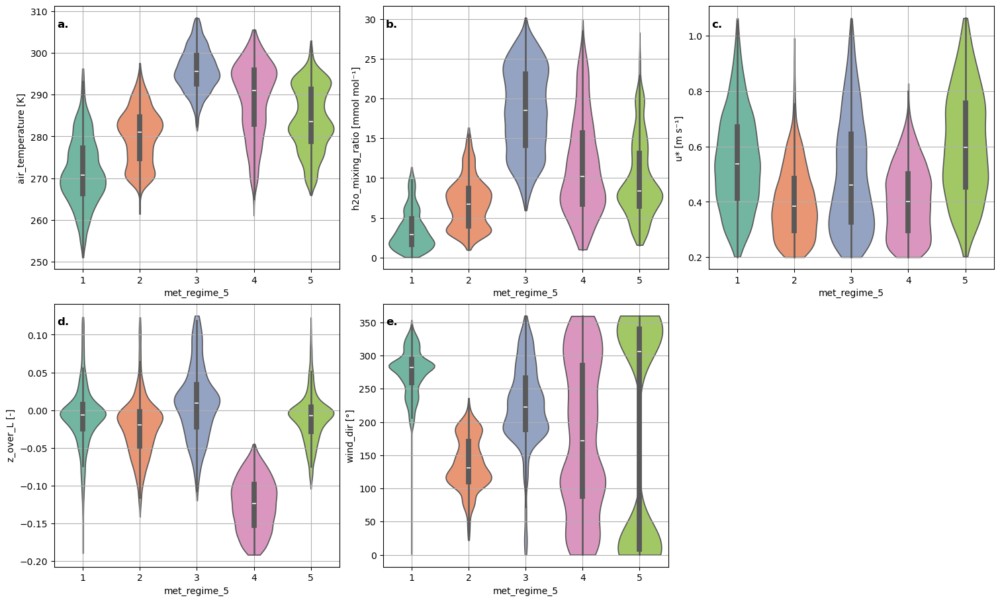

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=label_col, palette=cluster_palette,


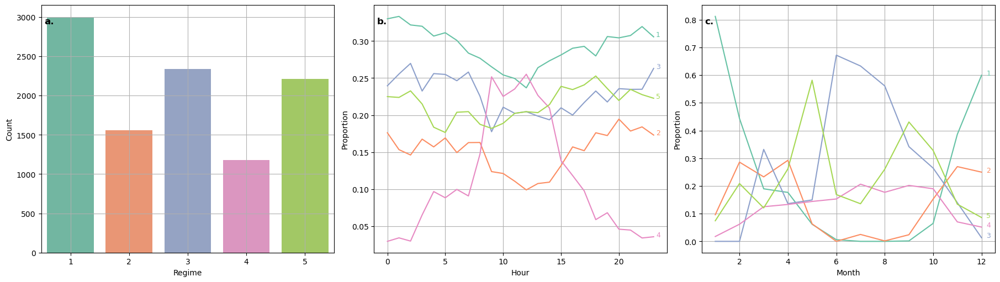

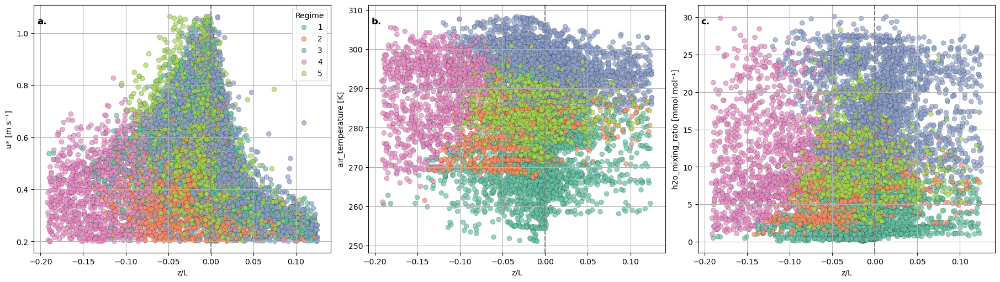

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=label_col, y=var, palette=cluster_pale

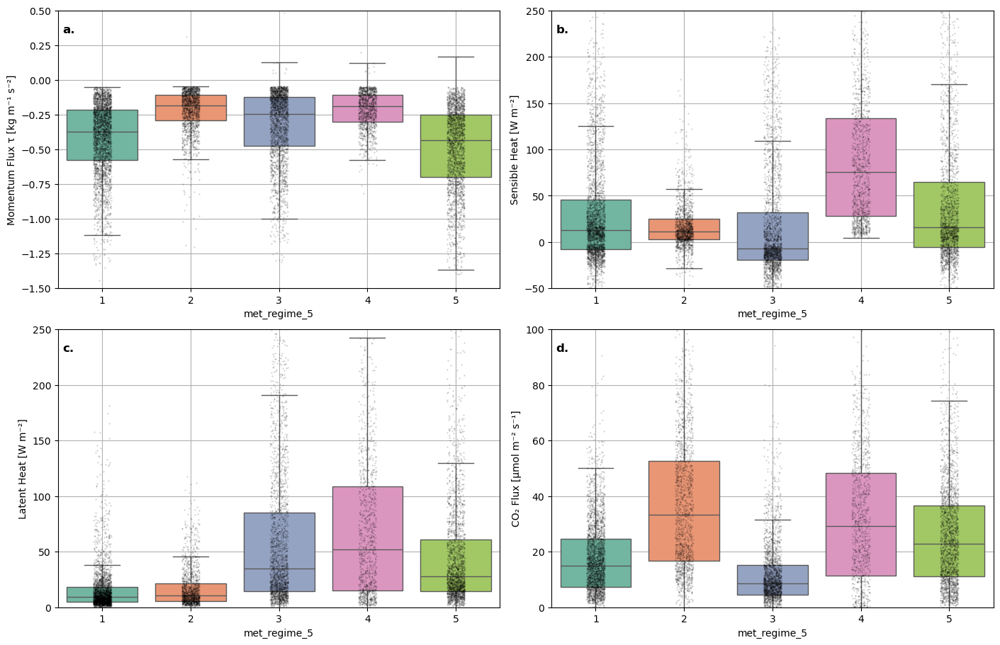

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:133: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:133: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/2139895149.py:133: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=clu

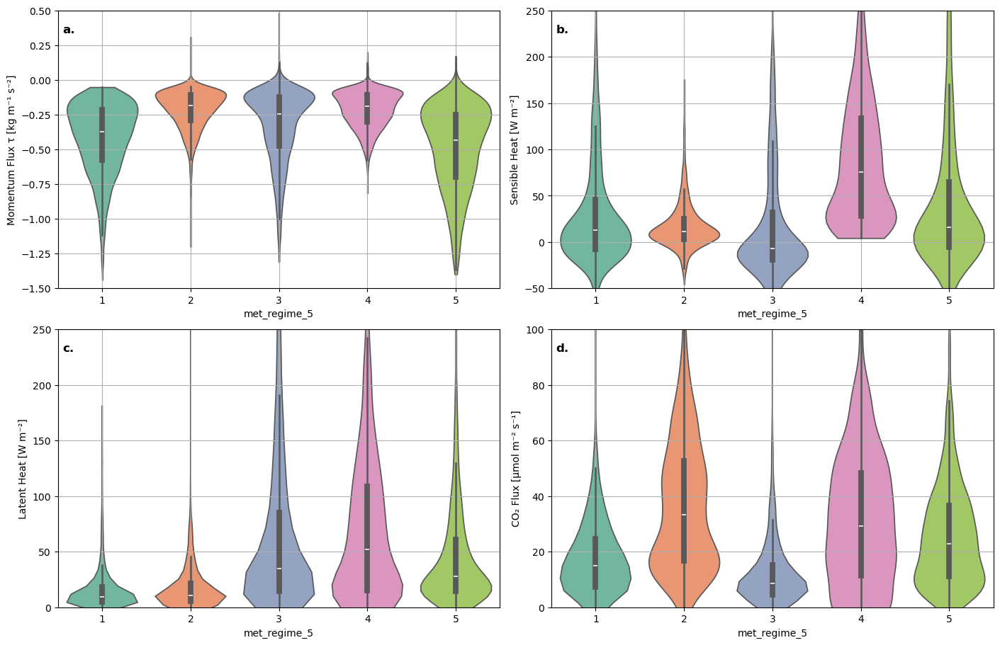

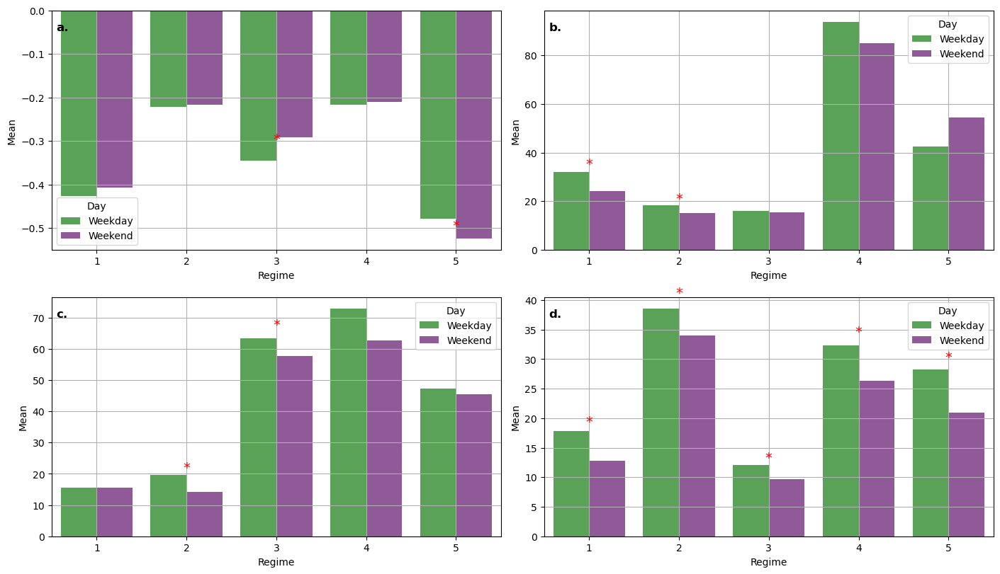


Weekday vs Weekend Flux Test Results:
Regime     Flux  Weekday Mean  Weekend Mean  U-statistic      p-value
     1      Tau     -0.425937     -0.406757     823028.0 2.079070e-01
     1        H     32.089234     24.046490     802157.5 5.740529e-04
     1       LE     15.539233     15.496665     821858.0 5.517608e-02
     1 co2_flux     17.802632     12.730715     919297.0 4.029302e-23
     2      Tau     -0.222205     -0.215993     303714.5 1.414462e-01
     2        H     18.466888     15.108710     260776.0 4.735051e-03
     2       LE     19.748883     14.308804     287800.5 6.796302e-09
     2 co2_flux     38.586025     33.953850     300177.0 5.888664e-03
     3      Tau     -0.345398     -0.290763     447579.0 3.239374e-05
     3        H     16.122871     15.410524     438893.0 8.431229e-01
     3       LE     63.293461     57.617778     485102.0 6.146540e-04
     3 co2_flux     12.023080      9.705978     480210.0 4.165439e-06
     4      Tau     -0.216752     -0.209393     123

In [130]:
cluster_vars = ['air_temperature', 'h2o_mixing_ratio', 'z_over_L', 'wind_u', 'wind_v']
custom_ylims = {
    'H': (-50, 250),
    'LE': (0, 250),
    'co2_flux': (0, 100),
    'Tau': (-1.5, 0.5)
}

df_clustered, flux_results = run_kmeans_analysis(
    df_cluster_ready,
    cluster_vars=cluster_vars,
    nclust=5,
    ylims=custom_ylims
)



# wih Bowen Ratio

In [ ]:
cluster_vars = ['air_temperature', 'h2o_mixing_ratio', 'z_over_L', 'u*', 'wind_u', 'wind_v', 'bowen_ratio']


/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/937560039.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/937560039.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/937560039.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=label_col, y=var, palette=cluster_p

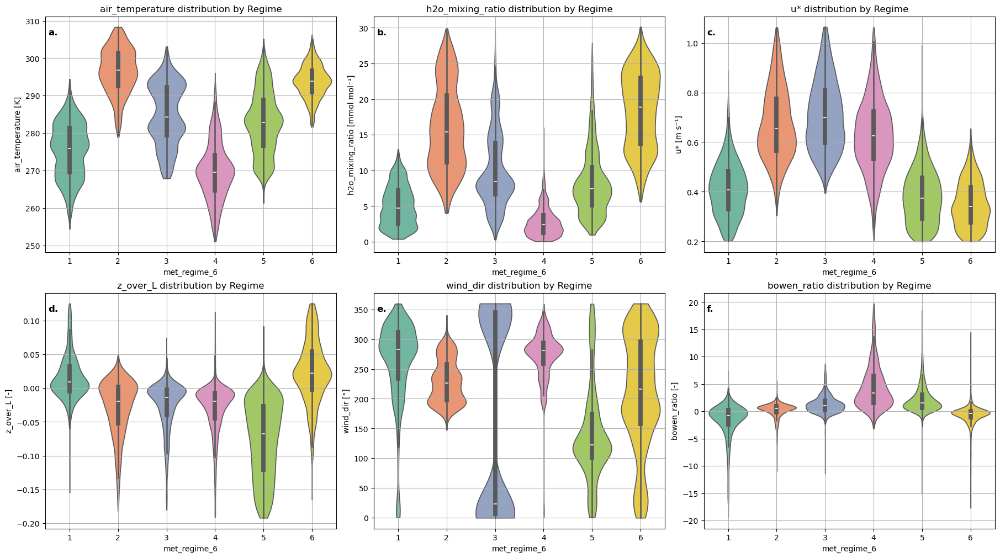

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/937560039.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=label_col, palette=cluster_palette,


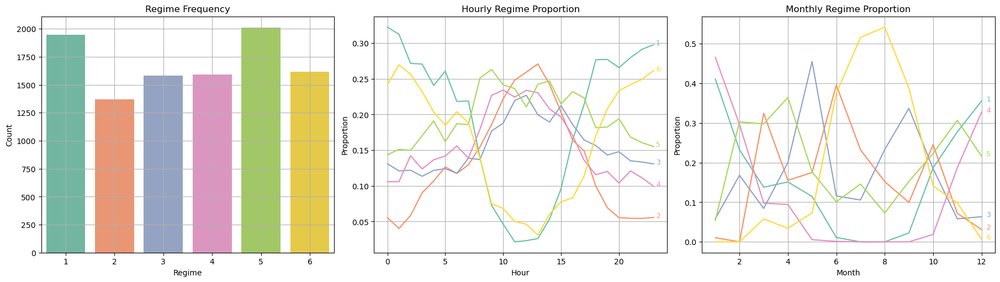

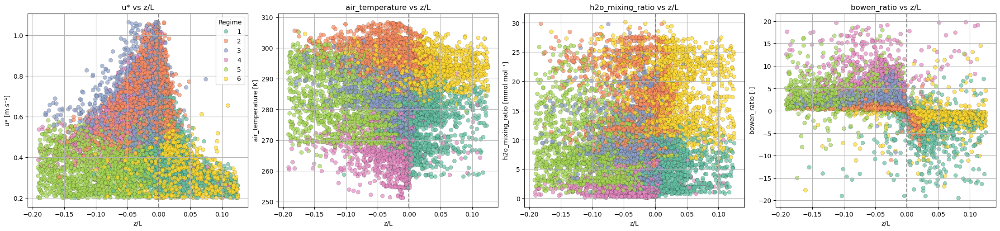

In [144]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.stats import mannwhitneyu
import numpy as np
import pandas as pd

def run_kmeans_analysis(
    df,
    cluster_vars=['air_temperature', 'h2o_mixing_ratio', 'z_over_L', 'u*', 'wind_u', 'wind_v', 'bowen_ratio'],
    nclust=6,
    label_prefix='met_regime',
    ylims=None
):
    df = df.copy()
    df = df[df['bowen_ratio'] >= -20]
    df = df[df['bowen_ratio'] <= 20]


    df['wind_u'] = df['u*'] * np.sin(np.radians(df['wind_dir']))
    df['wind_v'] = df['u*'] * np.cos(np.radians(df['wind_dir']))

    label_col = f"{label_prefix}_{nclust}"
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df[cluster_vars])
    kmeans = KMeans(n_clusters=nclust, random_state=42, n_init='auto')
    df[label_col] = (kmeans.fit_predict(X_scaled) + 1).astype(str)
    cluster_ids = sorted(df[label_col].unique(), key=lambda x: int(x))

    palette = sns.color_palette("Set2", max(8, nclust))
    cluster_palette = {cid: palette[int(cid)-1] for cid in cluster_ids}

    df['weekday'] = df['time'].dt.weekday
    df['is_weekend'] = df['weekday'] >= 5
    df['day_type'] = np.where(df['is_weekend'], 'Weekend', 'Weekday')

    # Violin plots of input vars
    plot_vars = ['air_temperature', 'h2o_mixing_ratio', 'u*', 'z_over_L', 'wind_dir', 'bowen_ratio']
    units = {
        'air_temperature': '[K]', 'h2o_mixing_ratio': '[mmol mol⁻¹]',
        'u*': '[m s⁻¹]', 'z_over_L': '[-]', 'wind_dir': '[°]', 'bowen_ratio': '[-]'
    }

    fig, axes = plt.subplots(2, 3, figsize=(18, 10), constrained_layout=True)
    for i, (ax, var) in enumerate(zip(axes.flatten(), plot_vars)):
        sns.violinplot(data=df, x=label_col, y=var, palette=cluster_palette,
                       order=cluster_ids, inner='box', cut=0, ax=ax)
        ax.set_ylabel(f"{var} {units.get(var, '')}")
        ax.set_title(f"{var} distribution by Regime")
        if ylims and var in ylims:
            ax.set_ylim(ylims[var])
        ax.grid(True)
        ax.text(0.01, 0.95, f"{chr(97+i)}.", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', weight='bold')
    plt.show()

    # Regime frequency plots
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
    sns.countplot(data=df, x=label_col, palette=cluster_palette,
                  order=cluster_ids, ax=axes[0])
    axes[0].set_title("Regime Frequency")
    axes[0].set_xlabel("Regime")
    axes[0].set_ylabel("Count")
    axes[0].grid(True)

    diurnal = df.groupby(['hour', label_col]).size().unstack(fill_value=0)
    diurnal = diurnal.divide(diurnal.sum(axis=1), axis=0)
    for cid in cluster_ids:
        axes[1].plot(diurnal.index, diurnal[cid], color=cluster_palette[cid])
        axes[1].text(diurnal.index[-1]+0.2, diurnal[cid].iloc[-1], f"{cid}",
                     color=cluster_palette[cid], fontsize=9)
    axes[1].set_title("Hourly Regime Proportion")
    axes[1].set_xlabel("Hour")
    axes[1].set_ylabel("Proportion")
    axes[1].grid(True)

    monthly = df.groupby(['month', label_col]).size().unstack(fill_value=0)
    monthly = monthly.divide(monthly.sum(axis=1), axis=0)
    for cid in cluster_ids:
        axes[2].plot(monthly.index, monthly[cid], color=cluster_palette[cid])
        axes[2].text(monthly.index[-1]+0.2, monthly[cid].iloc[-1], f"{cid}",
                     color=cluster_palette[cid], fontsize=9)
    axes[2].set_title("Monthly Regime Proportion")
    axes[2].set_xlabel("Month")
    axes[2].set_ylabel("Proportion")
    axes[2].grid(True)

    plt.show()

    # Scatterplots with z_over_L
    features = ['u*', 'air_temperature', 'h2o_mixing_ratio', 'bowen_ratio']
    fig, axes = plt.subplots(1, 4, figsize=(22, 5), constrained_layout=True)
    for i, var in enumerate(features):
        sns.scatterplot(data=df, x='z_over_L', y=var, hue=label_col,
                        palette=cluster_palette, hue_order=cluster_ids,
                        s=40, alpha=0.7, edgecolor='k', linewidth=0.2, ax=axes[i])
        axes[i].axvline(0, color='gray', linestyle='--')
        axes[i].set_title(f"{var} vs z/L")
        axes[i].set_xlabel("z/L")
        axes[i].set_ylabel(f"{var} {units.get(var, '')}")
        axes[i].grid(True)
        if i > 0:
            axes[i].get_legend().remove()
    axes[0].legend(title='Regime')
    plt.show()

    return df

df_result = run_kmeans_analysis(df_cluster_ready)



In [138]:
df_cluster_ready[df_cluster_ready['bowen_ratio']< -2000]

,time,filename,DOY,daytime,file_records,used_records,Tau,qc_Tau,H,qc_H,...,hour,month,doy,weekday,is_weekend,season,inv_L,z_over_L,wind_u,wind_v
12275,2025-04-25 01:00:00-05:00,2025-04-25T053000_smart3-00694.ghg,115.2499,1,36000,36000,-0.184148,0,10.0364,0,...,1,4,115,4,False,Spring,-0.001987,-0.019869,-0.203259,0.329876


# Evaluate clusters

/var/folders/c0/hb5cyy892hqdjht868lw3qk80000gp/T/ipykernel_53182/1106317816.py:46: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/bhupendra/mamba/envs/data/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


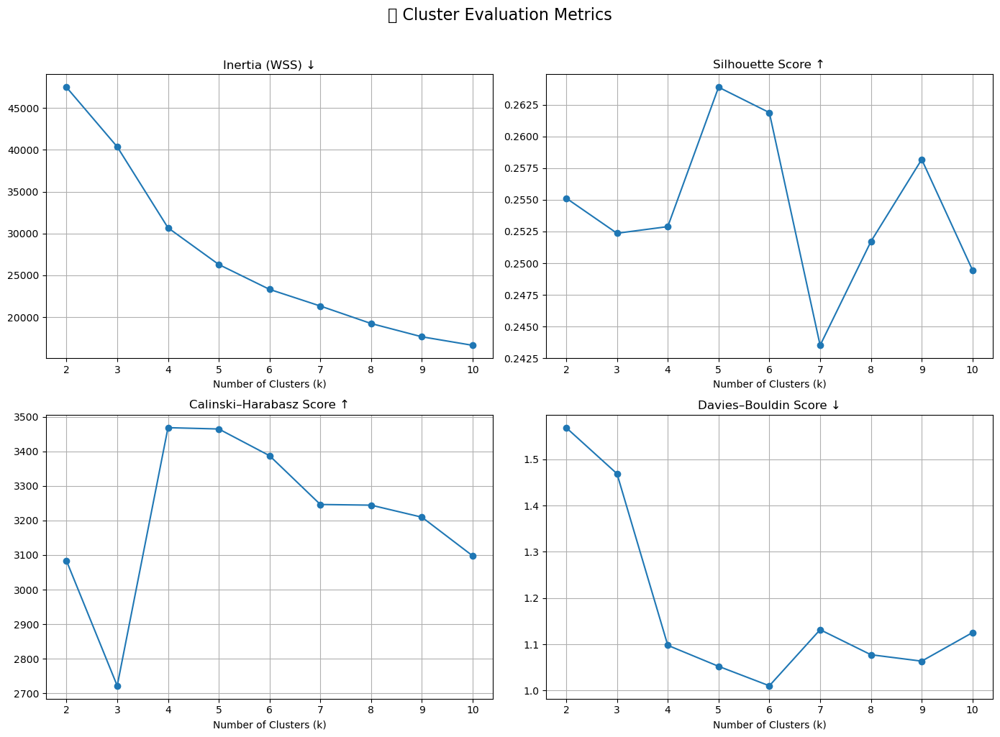

In [131]:
cluster_vars = ['air_temperature', 'h2o_mixing_ratio', 'wind_u', 'wind_v', 'z_over_L', 'bowen_ratio']
evaluate_all_cluster_scores(df_cluster_ready, cluster_vars)